In [1]:
!pip install xgboost
!pip install contextily
import pandas as pd
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from matplotlib.colors import LinearSegmentedColormap
from sklearn.inspection import permutation_importance
import contextily as ctx
from mpl_toolkits.axes_grid1 import make_axes_locatable





pd.set_option('display.max_columns', None)
df = pd.read_csv('merged_output/final_merged_dataset.csv')

columns_to_keep = []

for col in df.columns:
    if col[:4].isdigit() and '-' in col[4:7]:
        if col.startswith('2023'):
            columns_to_keep.append(col)
    else:
        columns_to_keep.append(col)

df = df[columns_to_keep]
df

,ZipCode,Longitude,Latitude,Zip Code,SizeRank,State,2023-01-31,2023-02-28,2023-03-31,2023-04-30,2023-05-31,2023-06-30,2023-07-31,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31,Crime_ARSON,Crime_ASSAULT,Crime_BATTERY,Crime_BURGLARY,Crime_CONCEALED CARRY LICENSE VIOLATION,Crime_CRIMINAL DAMAGE,Crime_CRIMINAL SEXUAL ASSAULT,Crime_CRIMINAL TRESPASS,Crime_DECEPTIVE PRACTICE,Crime_GAMBLING,Crime_HOMICIDE,Crime_HUMAN TRAFFICKING,Crime_INTERFERENCE WITH PUBLIC OFFICER,Crime_INTIMIDATION,Crime_KIDNAPPING,Crime_LIQUOR LAW VIOLATION,Crime_MOTOR VEHICLE THEFT,Crime_NARCOTICS,Crime_NON-CRIMINAL,Crime_OBSCENITY,Crime_OFFENSE INVOLVING CHILDREN,Crime_OTHER NARCOTIC VIOLATION,Crime_OTHER OFFENSE,Crime_PROSTITUTION,Crime_PUBLIC INDECENCY,Crime_PUBLIC PEACE VIOLATION,Crime_ROBBERY,Crime_SEX OFFENSE,Crime_STALKING,Crime_THEFT,Crime_WEAPONS VIOLATION,Total_Crimes,Most_Common_Crime,Long_Name,Primary_Category,Zip,Student_Count_Total,Student_Count_Low_Income,Student_Count_Special_Ed,Student_Count_English_Learners,Student_Count_Black,Student_Count_Hispanic,Student_Count_White,Student_Count_Asian,Student_Count_Native_American,Student_Count_Other_Ethnicity,Student_Count_Asian_Pacific_Islander,Student_Count_Multi,Student_Count_Hawaiian_Pacific_Islander,Student_Count_Ethnicity_Not_Available,Overall_Rating,Rating_Status,School_Latitude,School_Longitude,Location,Year
0,60411,-87.5904,41.5087,60411,736,IL,151084.230264,151086.956134,151528.318673,152643.124182,153373.705387,153959.023188,154394.152339,154685.155276,155030.441231,155858.041098,156373.645534,156539.979801,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,60415,-87.7774,41.7017,60415,8475,IL,189936.353767,189978.212689,190550.016643,192456.655867,194568.948718,196816.632180,199038.940750,201525.808491,203916.605925,206082.581765,207573.803258,208458.663562,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,60601,-87.6181,41.8858,60601,7958,IL,360297.241359,353622.208020,346759.202653,341575.810939,337092.286975,334798.298956,333899.222450,334725.780373,336417.548642,338490.369431,340327.626105,341156.132789,0.0,73.0,202.0,20.0,0.0,108.0,15.0,57.0,188.0,0.0,0.0,0.0,1.0,3.0,1.0,0.0,79.0,16.0,0.0,0.0,2.0,0.0,69.0,0.0,0.0,10.0,24.0,7.0,4.0,673.0,16.0,1568.0,THEFT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,60602,-87.6321,41.8829,60602,20351,IL,324556.664132,320254.244836,314327.351204,307567.856837,303135.966622,302604.736318,303658.545264,303955.478589,303518.039056,301421.153951,300383.548042,297484.970815,0.0,22.0,33.0,7.0,0.0,48.0,1.0,5.0,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,0.0,0.0,0.0,1.0,0.0,21.0,0.0,0.0,0.0,19.0,4.0,1.0,152.0,0.0,378.0,THEFT,Noble - Muchin College Prep,HS,60602.0,823.0,672.0,107.0,113.0,288.0,482.0,6.0,42.0,3.0,0.0,0.0,1.0,1.0,0.0,Level 1+,NOT APPLICABLE,41.882740,-87.626338,POINT (-87.626338 41.88274),2023.0
4,60602,-87.6321,41.8829,60602,20351,IL,324556.664132,320254.244836,314327.351204,307567.856837,303135.966622,302604.736318,303658.545264,303955.478589,303518.039056,301421.153951,300383.548042,297484.970815,0.0,22.0,33.0,7.0,0.0,48.0,1.0,5.0,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,0.0,0.0,0.0,1.0,0.0,21.0,0.0,0.0,0.0,19.0,4.0,1.0,152.0,0.0,378.0,THEFT,YCCS- Innovations HS of Arts Integration,HS,60602.0,455.0,393.0,89.0,8.0,421.0,23.0,7.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,Level 2+,NOT APPLICABLE,41.883047,-87.627734,POINT (-87.627734 41.883047),2023.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [2]:
cols_2023 = [col for col in df.columns if col.startswith('2023')]
df['average_housing_cost_2023'] = df[cols_2023].mean(axis=1)
df = df.drop(columns=cols_2023)

columns_to_drop = ['Year', 
                    'State', 'Longitude', 'Latitude', 'Zip Code', 'Location']

columns_to_drop = [col for col in columns_to_drop if col in df.columns]

if columns_to_drop:
    df = df.drop(columns=columns_to_drop)

df

,ZipCode,SizeRank,Crime_ARSON,Crime_ASSAULT,Crime_BATTERY,Crime_BURGLARY,Crime_CONCEALED CARRY LICENSE VIOLATION,Crime_CRIMINAL DAMAGE,Crime_CRIMINAL SEXUAL ASSAULT,Crime_CRIMINAL TRESPASS,Crime_DECEPTIVE PRACTICE,Crime_GAMBLING,Crime_HOMICIDE,Crime_HUMAN TRAFFICKING,Crime_INTERFERENCE WITH PUBLIC OFFICER,Crime_INTIMIDATION,Crime_KIDNAPPING,Crime_LIQUOR LAW VIOLATION,Crime_MOTOR VEHICLE THEFT,Crime_NARCOTICS,Crime_NON-CRIMINAL,Crime_OBSCENITY,Crime_OFFENSE INVOLVING CHILDREN,Crime_OTHER NARCOTIC VIOLATION,Crime_OTHER OFFENSE,Crime_PROSTITUTION,Crime_PUBLIC INDECENCY,Crime_PUBLIC PEACE VIOLATION,Crime_ROBBERY,Crime_SEX OFFENSE,Crime_STALKING,Crime_THEFT,Crime_WEAPONS VIOLATION,Total_Crimes,Most_Common_Crime,Long_Name,Primary_Category,Zip,Student_Count_Total,Student_Count_Low_Income,Student_Count_Special_Ed,Student_Count_English_Learners,Student_Count_Black,Student_Count_Hispanic,Student_Count_White,Student_Count_Asian,Student_Count_Native_American,Student_Count_Other_Ethnicity,Student_Count_Asian_Pacific_Islander,Student_Count_Multi,Student_Count_Hawaiian_Pacific_Islander,Student_Count_Ethnicity_Not_Available,Overall_Rating,Rating_Status,School_Latitude,School_Longitude,average_housing_cost_2023
0,60411,736,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,153879.731092
1,60415,8475,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,198408.601968
2,60601,7958,0.0,73.0,202.0,20.0,0.0,108.0,15.0,57.0,188.0,0.0,0.0,0.0,1.0,3.0,1.0,0.0,79.0,16.0,0.0,0.0,2.0,0.0,69.0,0.0,0.0,10.0,24.0,7.0,4.0,673.0,16.0,1568.0,THEFT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,341596.810724
3,60602,20351,0.0,22.0,33.0,7.0,0.0,48.0,1.0,5.0,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,0.0,0.0,0.0,1.0,0.0,21.0,0.0,0.0,0.0,19.0,4.0,1.0,152.0,0.0,378.0,THEFT,Noble - Muchin College Prep,HS,60602.0,823.0,672.0,107.0,113.0,288.0,482.0,6.0,42.0,3.0,0.0,0.0,1.0,1.0,0.0,Level 1+,NOT APPLICABLE,41.882740,-87.626338,306905.712972
4,60602,20351,0.0,22.0,33.0,7.0,0.0,48.0,1.0,5.0,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0,0.0,0.0,0.0,1.0,0.0,21.0,0.0,0.0,0.0,19.0,4.0,1.0,152.0,0.0,378.0,THEFT,YCCS- Innovations HS of Arts Integration,HS,60602.0,455.0,393.0,89.0,8.0,421.0,23.0,7.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,Level 2+,NOT APPLICABLE,41.883047,-87.627734,306905.712972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
652,60660,1545,1.0,225.0,488.0,136.0,0.0,318.0,23.0,83.0,261.0,0.0,2.0,0.0,6.0,13.0,2.0,1.0,288.0,20.0,0.0,0.0,7.0,0.0,172.0,0.0,0.0,3.0,77.0,27.0,8.0,1016.0,24.0,3201.0,THEFT,George B Swift Elementary Specialty School,ES,60660.0,547.0,363.0,104.0,290.0,135.0,154.0,91.0,149.0,2.0,0.0,0.0,16.0,0.0,0.0,Level 2+,GOOD STANDING,41.989139,-87.658296,238645.845071
653,60660,1545,1.0,225.0,488.0,136.0,0.0,318.0,23.0,83.0,261.0,0.0,2.0,0.0,6.0,13.0,2.0,1.0,288.0,20.0,0.0,0.0,7.0,0.0,172.0,0.0,0.0,3.0,77.0,27.0,8.0,1016.0,24.0,3201.0,THEFT,Nicholas Senn High School,HS,60660.0,1508.0,1092.0,198.0,299.0,396.0,604.0,267.0,191.0,11.0,0.0,0.0,37.0,2.0,0.0,Level 1,GOOD STANDING,41.989029,-87.667136,238645.845071
654,60660,1545,1.0,225.0,488.0,136.0,0.0,318.0,23.0,83.0,261.0,0.0,2.0,0.0,6.0,13.0,2.0,1.0,288.0,20.0,0.0,0.0,7.0,0.0,172.0,0.0,0.0,3.0,77.0,27.0,8.0,1016.0,24.0,3201.0,THEFT,Stephen K Hayt Elementary School,ES,60660.0,877.0,618.0,144.0,452.0,172.0,374.0,79.0,216.0,9.0,0.0,0.0,25.0,2.0,0.0,Level 1,GOOD STANDING,41.994541,-87.668504,238645.845071
655,60660,1545,1.0,225.0,488.0,136.0,0.0,318.0,23.0,83.0,261.0,0.0,2.0,0.0,6.0,13.0,2.0,

In [3]:
df1 = df[['ZipCode', 'Total_Crimes', 'Student_Count_Total', 'Student_Count_Low_Income',
    'Overall_Rating', 'Rating_Status', 'average_housing_cost_2023', 'Long_Name']]

df1

,ZipCode,Total_Crimes,Student_Count_Total,Student_Count_Low_Income,Overall_Rating,Rating_Status,average_housing_cost_2023,Long_Name
0,60411,0.0,NaN,NaN,NaN,NaN,153879.731092,NaN
1,60415,0.0,NaN,NaN,NaN,NaN,198408.601968,NaN
2,60601,1568.0,NaN,NaN,NaN,NaN,341596.810724,NaN
3,60602,378.0,823.0,672.0,Level 1+,NOT APPLICABLE,306905.712972,Noble - Muchin College Prep
4,60602,378.0,455.0,393.0,Level 2+,NOT APPLICABLE,306905.712972,YCCS- Innovations HS of Arts Integration
...,...,...,...,...,...,...,...,...
652,60660,3201.0,547.0,363.0,Level 2+,GOOD STANDING,238645.845071,George B Swift Elementary Specialty School
653,60660,3201.0,1508.0,1092.0,Level 1,GOOD STANDING,238645.845071,Nicholas Senn High School
654,60660,3201.0,877.0,618.0,Level 1,GOOD STANDING,238645.845071,Stephen K Hayt Elementary School
655,60660,3201.0,304.0,231.0,Level 2+,NOT APPLICABLE,238645.845071,Asian Human Services - Passages Charter School


In [4]:
df1 = df1.dropna()

In [5]:
df1.Rating_Status.value_counts()

Rating_Status
GOOD STANDING          402
NOT APPLICABLE         123
PROVISIONAL SUPPORT     69
INTENSIVE SUPPORT       52
Name: count, dtype: int64

In [6]:
df1.Long_Name.value_counts()

Long_Name
Noble - Muchin College Prep                       1
Acero Charter Schools - Rufino Tamayo             1
Norman A Bridge Elementary School                 1
Marvin Camras Elementary School                   1
Sir Miles Davis Magnet Elementary Academy         1
                                                 ..
Perspectives - Leadership Academy                 1
Fort Dearborn Elementary School                   1
Rudyard Kipling Elementary School                 1
Richard J Oglesby Elementary School               1
Asian Human Services - Passages Charter School    1
Name: count, Length: 646, dtype: int64

In [7]:
df1.Overall_Rating.value_counts()

Overall_Rating
Level 1              194
Level 2+             150
Level 1+             148
Level 2              125
Inability to Rate     21
Level 3                8
Name: count, dtype: int64

In [8]:
## turn these names into values
rating_mapping = {
    'Level 1': 1,
    'Level 1+': 1,  # Combining Level 1+ with Level 1
    'Level 2': 2,
    'Level 2+': 2,  # Combining Level 2+ with Level 2
    'Level 3': 3,
    'Inability to Rate': np.nan  # Set to NaN
}


df1 = df1.copy()
df1['Overall_Rating'] = df1['Overall_Rating'].map(rating_mapping)
df1

,ZipCode,Total_Crimes,Student_Count_Total,Student_Count_Low_Income,Overall_Rating,Rating_Status,average_housing_cost_2023,Long_Name
3,60602,378.0,823.0,672.0,1.0,NOT APPLICABLE,306905.712972,Noble - Muchin College Prep
4,60602,378.0,455.0,393.0,2.0,NOT APPLICABLE,306905.712972,YCCS- Innovations HS of Arts Integration
7,60605,3515.0,1929.0,719.0,1.0,GOOD STANDING,331279.966498,William Jones College Preparatory High School
9,60607,1632.0,2149.0,779.0,1.0,GOOD STANDING,395418.829605,Whitney M Young Magnet High School
10,60607,1632.0,3.0,0.0,2.0,NOT APPLICABLE,395418.829605,Chicago Virtual Charter School
...,...,...,...,...,...,...,...,...
651,60660,3201.0,1063.0,360.0,1.0,GOOD STANDING,238645.845071,Helen Peirce International Studies ES
652,60660,3201.0,547.0,363.0,2.0,GOOD STANDING,238645.845071,George B Swift Elementary Specialty School
653,60660,3201.0,1508.0,1092.0,1.0,GOOD STANDING,238645.845071,Nicholas Senn High School
654,60660,3201.0,877.0,618.0,1.0,GOOD STANDING,238645.845071,Stephen K Hayt Elementary School


In [9]:
df1.Rating_Status.value_counts()

Rating_Status
GOOD STANDING          402
NOT APPLICABLE         123
PROVISIONAL SUPPORT     69
INTENSIVE SUPPORT       52
Name: count, dtype: int64

In [10]:
## turn these names into values
rating_mapping2 = {
    'GOOD STANDING': 3,
    'PROVISIONAL SUPPORT': 2,
    'INTENSIVE SUPPORT': 1,
    'NOT APPLICABLE': np.nan
}


df1 = df1.copy()
df1['Rating_Status'] = df1['Rating_Status'].map(rating_mapping2)
df1

,ZipCode,Total_Crimes,Student_Count_Total,Student_Count_Low_Income,Overall_Rating,Rating_Status,average_housing_cost_2023,Long_Name
3,60602,378.0,823.0,672.0,1.0,NaN,306905.712972,Noble - Muchin College Prep
4,60602,378.0,455.0,393.0,2.0,NaN,306905.712972,YCCS- Innovations HS of Arts Integration
7,60605,3515.0,1929.0,719.0,1.0,3.0,331279.966498,William Jones College Preparatory High School
9,60607,1632.0,2149.0,779.0,1.0,3.0,395418.829605,Whitney M Young Magnet High School
10,60607,1632.0,3.0,0.0,2.0,NaN,395418.829605,Chicago Virtual Charter School
...,...,...,...,...,...,...,...,...
651,60660,3201.0,1063.0,360.0,1.0,3.0,238645.845071,Helen Peirce International Studies ES
652,60660,3201.0,547.0,363.0,2.0,3.0,238645.845071,George B Swift Elementary Specialty School
653,60660,3201.0,1508.0,1092.0,1.0,3.0,238645.845071,Nicholas Senn High School
654,60660,3201.0,877.0,618.0,1.0,3.0,238645.845071,Stephen K Hayt Elementary School


In [11]:
df1['Low_Income_Percentage'] = df1['Student_Count_Low_Income'] / df1['Student_Count_Total']
df1

,ZipCode,Total_Crimes,Student_Count_Total,Student_Count_Low_Income,Overall_Rating,Rating_Status,average_housing_cost_2023,Long_Name,Low_Income_Percentage
3,60602,378.0,823.0,672.0,1.0,NaN,306905.712972,Noble - Muchin College Prep,0.816525
4,60602,378.0,455.0,393.0,2.0,NaN,306905.712972,YCCS- Innovations HS of Arts Integration,0.863736
7,60605,3515.0,1929.0,719.0,1.0,3.0,331279.966498,William Jones College Preparatory High School,0.372732
9,60607,1632.0,2149.0,779.0,1.0,3.0,395418.829605,Whitney M Young Magnet High School,0.362494
10,60607,1632.0,3.0,0.0,2.0,NaN,395418.829605,Chicago Virtual Charter School,0.000000
...,...,...,...,...,...,...,...,...,...
651,60660,3201.0,1063.0,360.0,1.0,3.0,238645.845071,Helen Peirce International Studies ES,0.338664
652,60660,3201.0,547.0,363.0,2.0,3.0,238645.845071,George B Swift Elementary Specialty School,0.663620
653,60660,3201.0,1508.0,1092.0,1.0,3.0,238645.845071,Nicholas Senn High School,0.724138
654,60660,3201.0,877.0,618.0,1.0,3.0,238645.845071,Stephen K Hayt Elementary School,0.704675


In [12]:
df1 = df1.drop(columns=['Student_Count_Total', 'Student_Count_Low_Income'])
df1

,ZipCode,Total_Crimes,Overall_Rating,Rating_Status,average_housing_cost_2023,Long_Name,Low_Income_Percentage
3,60602,378.0,1.0,NaN,306905.712972,Noble - Muchin College Prep,0.816525
4,60602,378.0,2.0,NaN,306905.712972,YCCS- Innovations HS of Arts Integration,0.863736
7,60605,3515.0,1.0,3.0,331279.966498,William Jones College Preparatory High School,0.372732
9,60607,1632.0,1.0,3.0,395418.829605,Whitney M Young Magnet High School,0.362494
10,60607,1632.0,2.0,NaN,395418.829605,Chicago Virtual Charter School,0.000000
...,...,...,...,...,...,...,...
651,60660,3201.0,1.0,3.0,238645.845071,Helen Peirce International Studies ES,0.338664
652,60660,3201.0,2.0,3.0,238645.845071,George B Swift Elementary Specialty School,0.663620
653,60660,3201.0,1.0,3.0,238645.845071,Nicholas Senn High School,0.724138
654,60660,3201.0,1.0,3.0,238645.845071,Stephen K Hayt Elementary School,0.704675


In [13]:
df1.ZipCode.nunique()

49

In [14]:
df1 = df1.dropna()

Housing Cost Prediction Results:
Mean Squared Error: $1433535562.92
Root Mean Squared Error: $37862.06
Mean Absolute Error: $21562.20
R² Score: 0.9101


/var/folders/h6/655zg1890sg4l1s1rk51_cz00000gn/T/ipykernel_45083/1997948595.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Rating_Status'] = df1['Rating_Status'].fillna(-1)


<Figure size 1200x800 with 0 Axes>

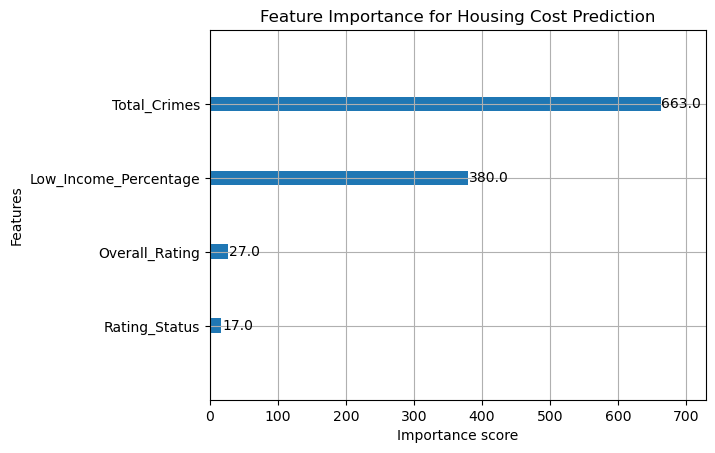


School Rating Prediction Results:
Root Mean Squared Error: 0.4404
R² Score: 0.3275


<Figure size 1200x800 with 0 Axes>

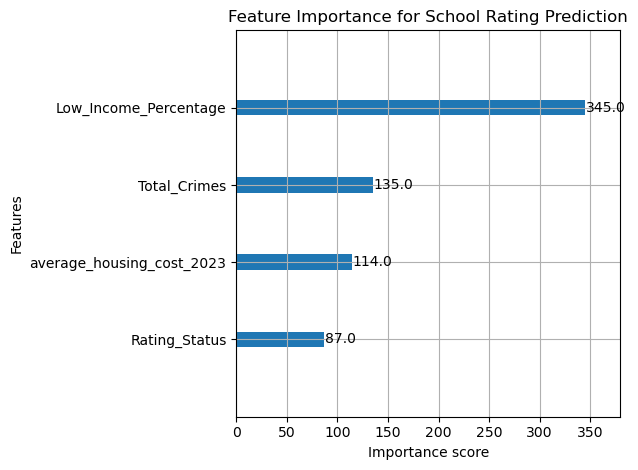

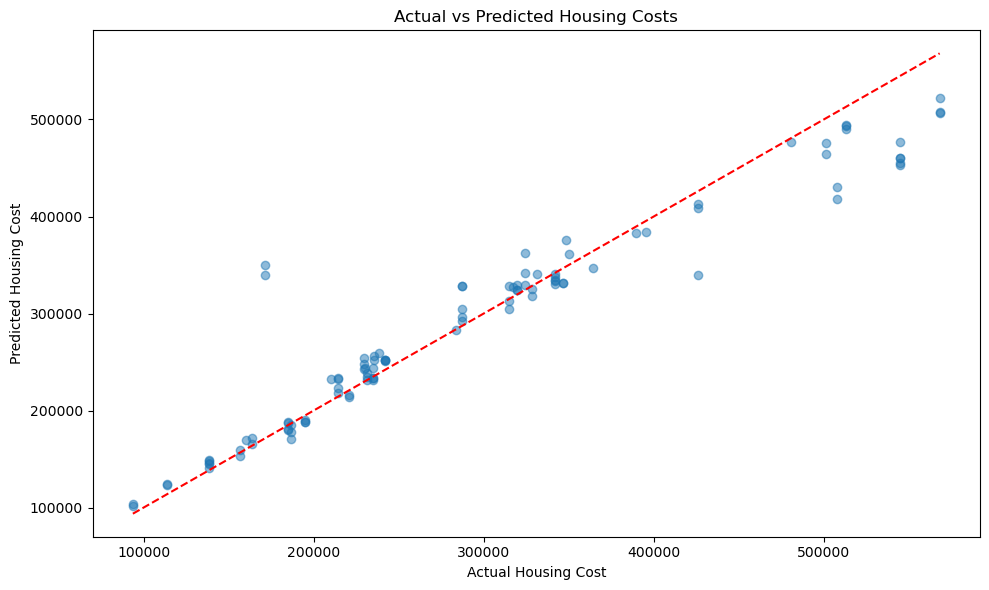

In [15]:
df1['Rating_Status'] = df1['Rating_Status'].fillna(-1)

X = df1.drop(columns=['Long_Name', 'ZipCode', 'average_housing_cost_2023'])
y_housing = df1['average_housing_cost_2023']

X_train, X_test, y_train, y_test = train_test_split(X, y_housing, test_size=0.2, random_state=42)

model_housing = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    max_depth=4,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

model_housing.fit(X_train, y_train)

y_pred = model_housing.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Housing Cost Prediction Results:")
print(f"Mean Squared Error: ${mse:.2f}")
print(f"Root Mean Squared Error: ${rmse:.2f}")
print(f"Mean Absolute Error: ${mae:.2f}")
print(f"R² Score: {r2:.4f}")

plt.figure(figsize=(12, 8))
xgb.plot_importance(model_housing, max_num_features=10)
plt.title('Feature Importance for Housing Cost Prediction')
# plt.tight_layout()
# plt.savefig('housing_feature_importance.png', dpi=300)
plt.show()

X_rating = df1.drop(columns=['Long_Name', 'ZipCode', 'Overall_Rating'])
y_rating = df1['Overall_Rating']

X_train_rating, X_test_rating, y_train_rating, y_test_rating = train_test_split(
    X_rating, y_rating, test_size=0.2, random_state=42
)


model_rating = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    max_depth=3,
    learning_rate=0.1,
    random_state=42
)

model_rating.fit(X_train_rating, y_train_rating)

y_pred_rating = model_rating.predict(X_test_rating)

mse_rating = mean_squared_error(y_test_rating, y_pred_rating)
rmse_rating = np.sqrt(mse_rating)
r2_rating = r2_score(y_test_rating, y_pred_rating)

print("\nSchool Rating Prediction Results:")
print(f"Root Mean Squared Error: {rmse_rating:.4f}")
print(f"R² Score: {r2_rating:.4f}")

plt.figure(figsize=(12, 8))
xgb.plot_importance(model_rating, max_num_features=10)
plt.title('Feature Importance for School Rating Prediction')
plt.tight_layout()
# plt.savefig('rating_feature_importance.png', dpi=300)
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Housing Cost')
plt.ylabel('Predicted Housing Cost')
plt.title('Actual vs Predicted Housing Costs')
plt.tight_layout()
# plt.savefig('housing_prediction_scatter.png', dpi=300)
plt.show()

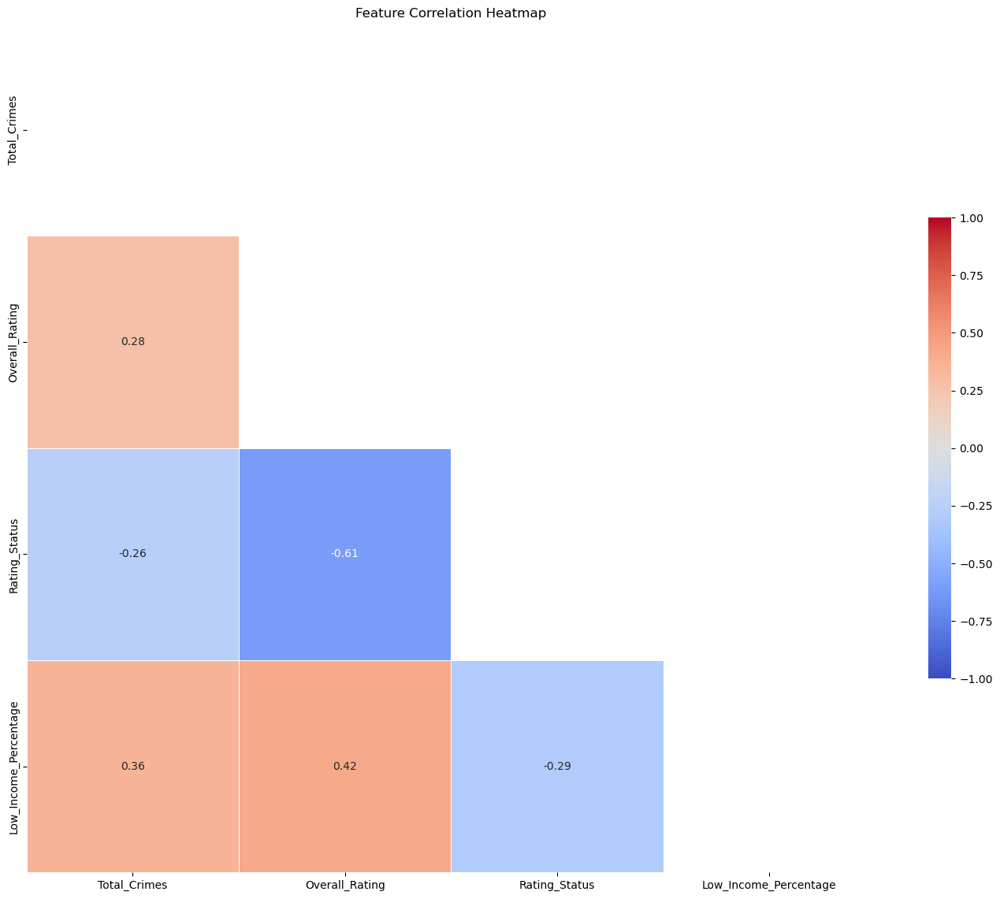

In [16]:
corr = df1[X.columns].corr()
plt.figure(figsize=(14, 12))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, cmap='coolwarm', vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f')
plt.title('Feature Correlation Heatmap')
plt.tight_layout()
# plt.savefig('correlation_heatmap.png', dpi=300)
plt.show()

Total rows in map_df: 503
Rows with latitude data: 503
Rows with longitude data: 503


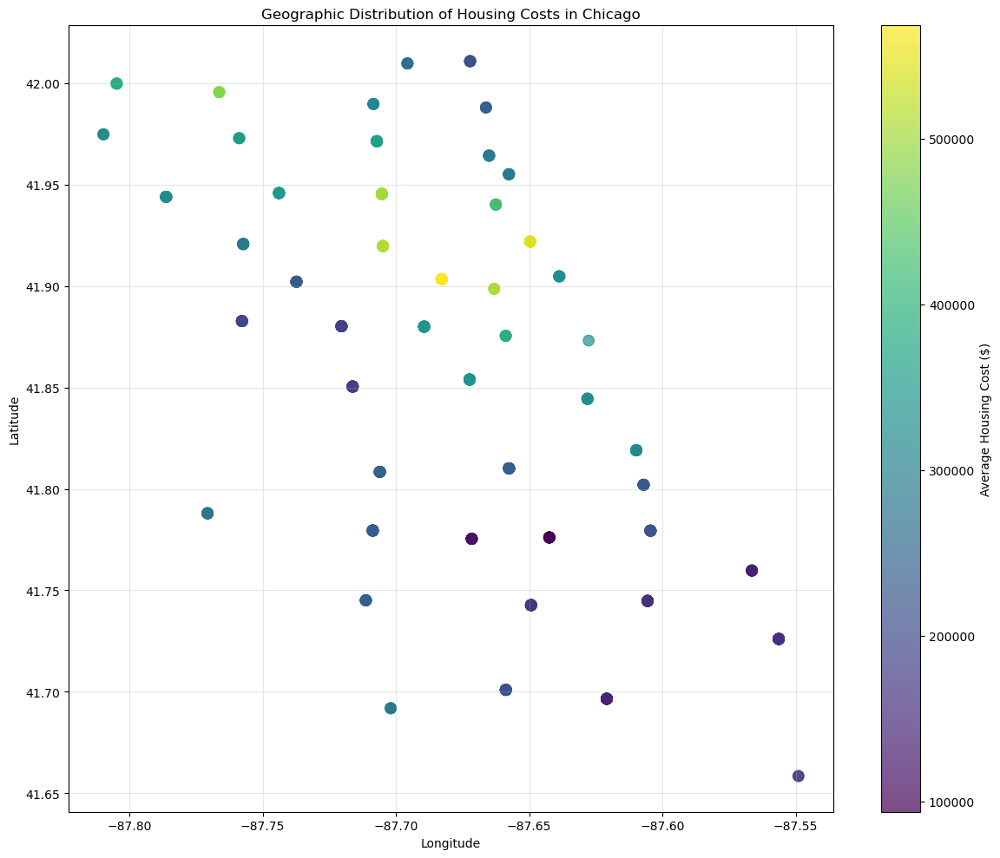

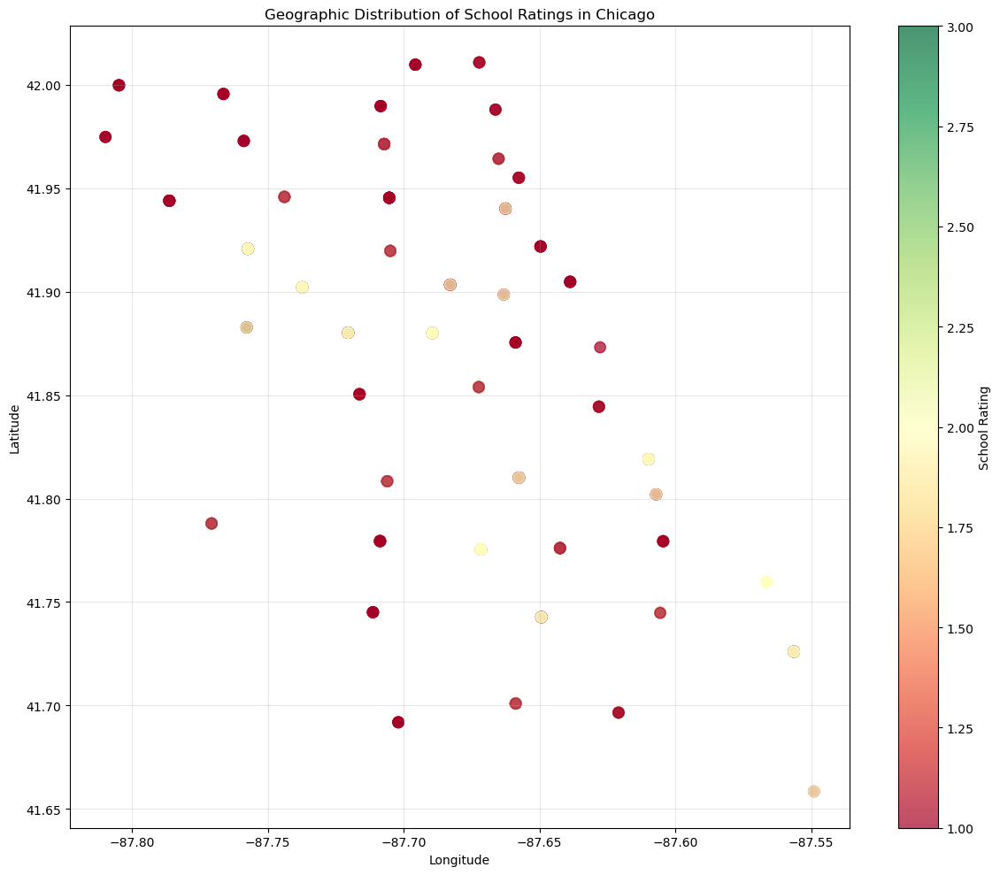

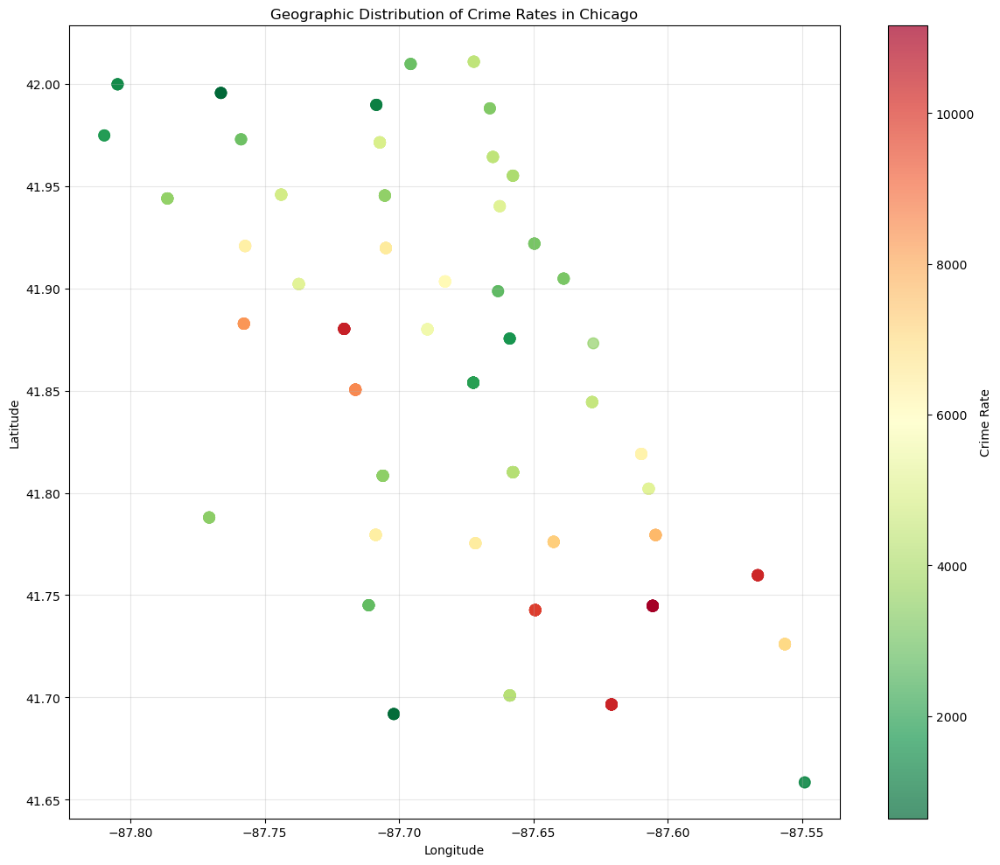

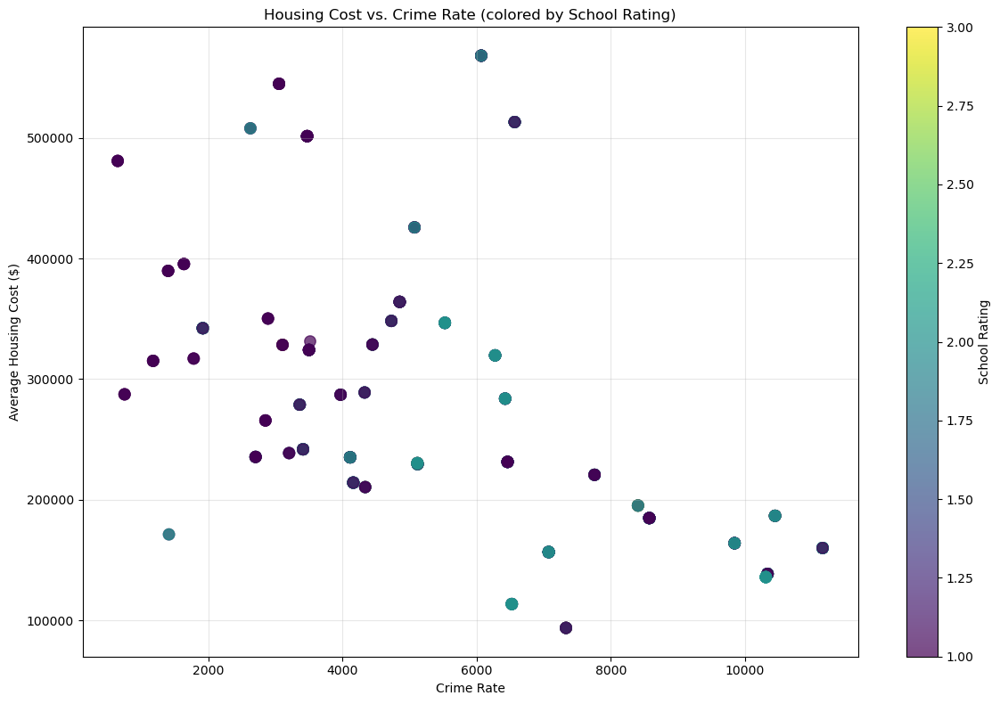

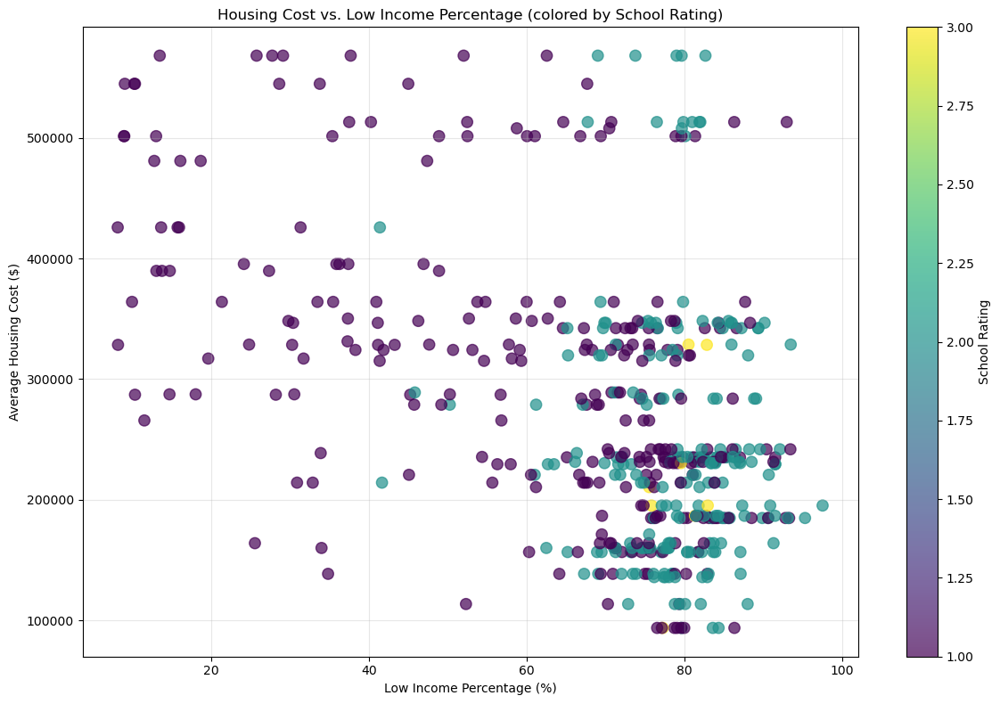

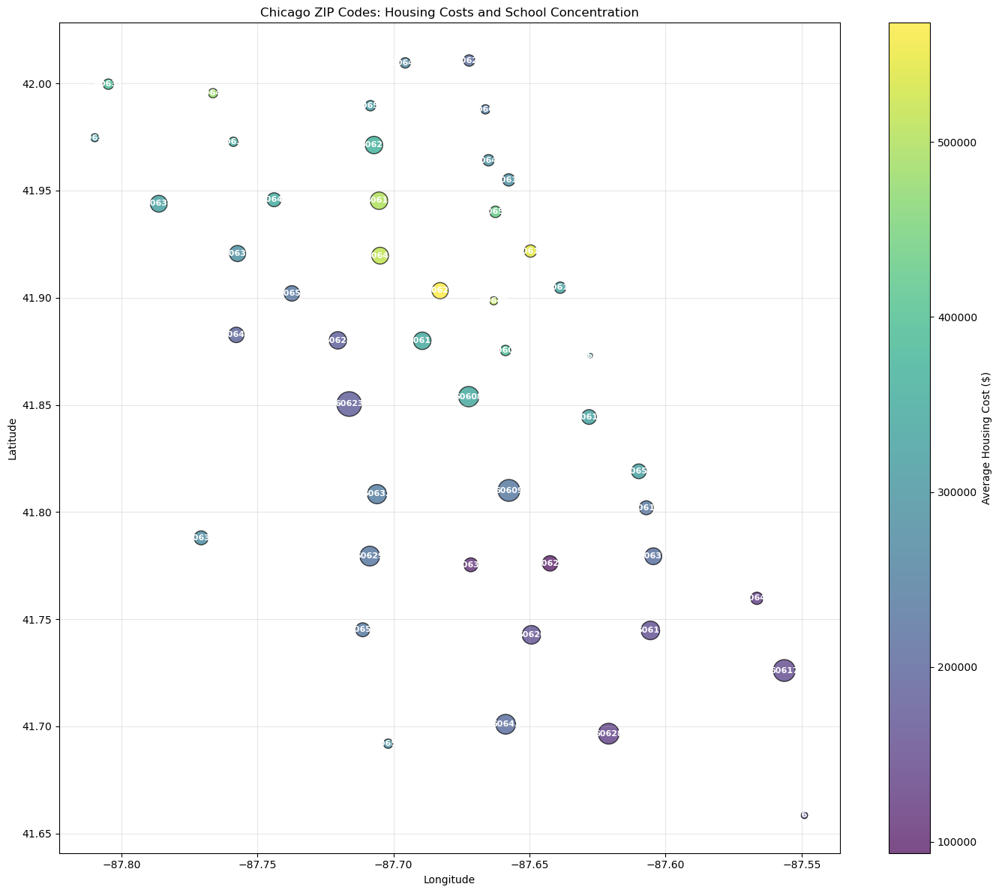

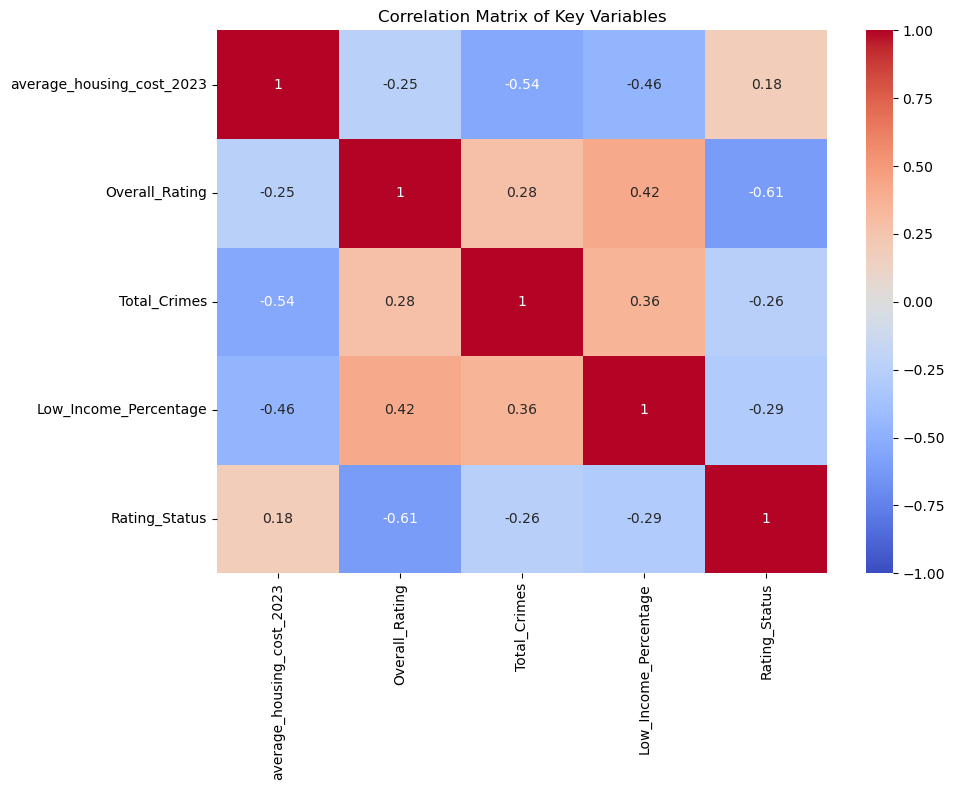

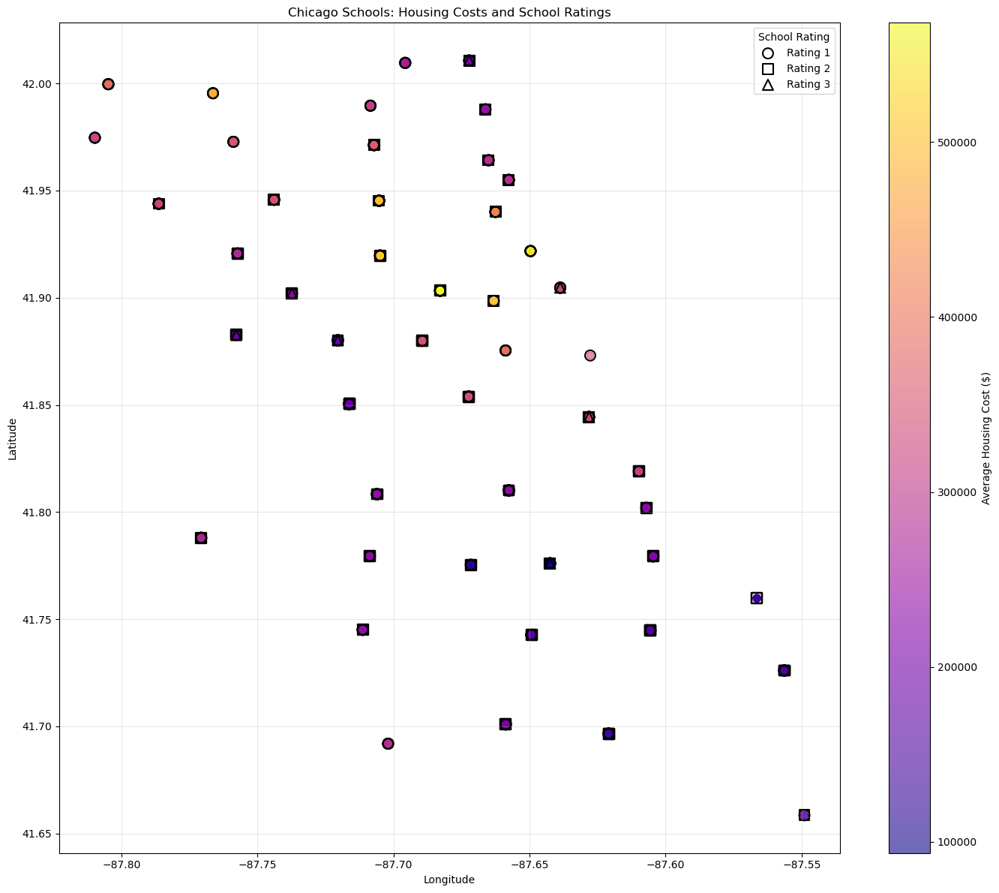

In [17]:
zip_coords = df.groupby('ZipCode')[['School_Latitude', 'School_Longitude']].mean().reset_index()

map_df = df1.merge(zip_coords, on='ZipCode', how='left')

print(f"Total rows in map_df: {len(map_df)}")
print(f"Rows with latitude data: {map_df['School_Latitude'].notna().sum()}")
print(f"Rows with longitude data: {map_df['School_Longitude'].notna().sum()}")

plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    map_df['School_Longitude'], 
    map_df['School_Latitude'],
    c=map_df['average_housing_cost_2023'],
    cmap='viridis',
    alpha=0.7,
    s=80
)

plt.colorbar(scatter, label='Average Housing Cost ($)')
plt.title('Geographic Distribution of Housing Costs in Chicago')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('chicago_housing_map.png', dpi=300)
plt.show()

plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    map_df['School_Longitude'], 
    map_df['School_Latitude'],
    c=map_df['Overall_Rating'],
    cmap='RdYlGn',
    alpha=0.7,
    s=80
)

plt.colorbar(scatter, label='School Rating')
plt.title('Geographic Distribution of School Ratings in Chicago')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('chicago_school_rating_map.png', dpi=300)
plt.show()

plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    map_df['School_Longitude'], 
    map_df['School_Latitude'],
    c=map_df['Total_Crimes'],
    cmap='RdYlGn_r',
    alpha=0.7,
    s=80
)

plt.colorbar(scatter, label='Crime Rate')
plt.title('Geographic Distribution of Crime Rates in Chicago')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('chicago_crime_map.png', dpi=300)
plt.show()

plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    map_df['Total_Crimes'],
    map_df['average_housing_cost_2023'],
    c=map_df['Overall_Rating'],
    cmap='viridis',
    alpha=0.7,
    s=80
)

plt.colorbar(scatter, label='School Rating')
plt.title('Housing Cost vs. Crime Rate (colored by School Rating)')
plt.xlabel('Crime Rate')
plt.ylabel('Average Housing Cost ($)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('housing_crime_scatter.png', dpi=300)
plt.show()

plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    map_df['Low_Income_Percentage'] * 100,
    map_df['average_housing_cost_2023'],
    c=map_df['Overall_Rating'],
    cmap='viridis',
    alpha=0.7,
    s=80
)

plt.colorbar(scatter, label='School Rating')
plt.title('Housing Cost vs. Low Income Percentage (colored by School Rating)')
plt.xlabel('Low Income Percentage (%)')
plt.ylabel('Average Housing Cost ($)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('housing_income_scatter.png', dpi=300)
plt.show()

zip_summary = map_df.groupby('ZipCode').agg({
    'average_housing_cost_2023': 'mean',
    'Total_Crimes': 'mean',
    'Overall_Rating': 'mean',
    'Low_Income_Percentage': 'mean',
    'School_Latitude': 'mean',
    'School_Longitude': 'mean'
}).reset_index()

school_counts = map_df['ZipCode'].value_counts().reset_index()
school_counts.columns = ['ZipCode', 'SchoolCount']
zip_summary = zip_summary.merge(school_counts, on='ZipCode', how='left')

plt.figure(figsize=(14, 12))
scatter = plt.scatter(
    zip_summary['School_Longitude'],
    zip_summary['School_Latitude'],
    c=zip_summary['average_housing_cost_2023'],
    s=zip_summary['SchoolCount'] * 20,
    cmap='viridis',
    alpha=0.7,
    edgecolors='black'
)

for _, row in zip_summary.iterrows():
    plt.annotate(
        str(int(row['ZipCode'])),
        (row['School_Longitude'], row['School_Latitude']),
        fontsize=8,
        ha='center',
        va='center',
        color='white',
        fontweight='bold'
    )

plt.colorbar(scatter, label='Average Housing Cost ($)')
plt.title('Chicago ZIP Codes: Housing Costs and School Concentration')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('chicago_zipcode_housing_schools.png', dpi=300)
plt.show()

corr_vars = ['average_housing_cost_2023', 'Overall_Rating', 
             'Total_Crimes', 'Low_Income_Percentage',
             'Rating_Status']
corr_matrix = map_df[corr_vars].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix of Key Variables')
plt.tight_layout()
plt.savefig('correlation_matrix.png', dpi=300)
plt.show()

fig, ax = plt.subplots(figsize=(14, 12))
scatter = ax.scatter(
    map_df['School_Longitude'],
    map_df['School_Latitude'],
    c=map_df['average_housing_cost_2023'],
    cmap='plasma',
    alpha=0.6,
    s=50
)

markers = {1: 'o', 2: 's', 3: '^'}
for rating in markers:
    mask = map_df['Overall_Rating'] == rating
    ax.scatter(
        map_df.loc[mask, 'School_Longitude'],
        map_df.loc[mask, 'School_Latitude'],
        marker=markers[rating],
        facecolors='none',
        edgecolors='black',
        linewidths=1.5,
        s=100,
        label=f'Rating {rating}'
    )

plt.colorbar(scatter, label='Average Housing Cost ($)')
plt.title('Chicago Schools: Housing Costs and School Ratings')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='School Rating')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('chicago_housing_rating_combined.png', dpi=300)
plt.show()

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.ticker as mticker


map_df = df1.merge(df[['ZipCode', 'School_Latitude', 'School_Longitude', 'Long_Name']], 
                  on=['ZipCode', 'Long_Name'], 
                  how='inner')


print(f"Total rows in map_df: {len(map_df)}")
print(f"Rows with latitude data: {map_df['School_Latitude'].notna().sum()}")
print(f"Rows with longitude data: {map_df['School_Longitude'].notna().sum()}")
print(f"Unique coordinates: {map_df[['School_Latitude', 'School_Longitude']].drop_duplicates().shape[0]}")


def currency_formatter(x, pos):
    return f"${x:,.0f}"
currency_format = mticker.FuncFormatter(currency_formatter)


def pct_formatter(x, pos):
    return f"{x:.0f}%"
pct_format = mticker.FuncFormatter(pct_formatter)

Total rows in map_df: 503
Rows with latitude data: 503
Rows with longitude data: 503
Unique coordinates: 503


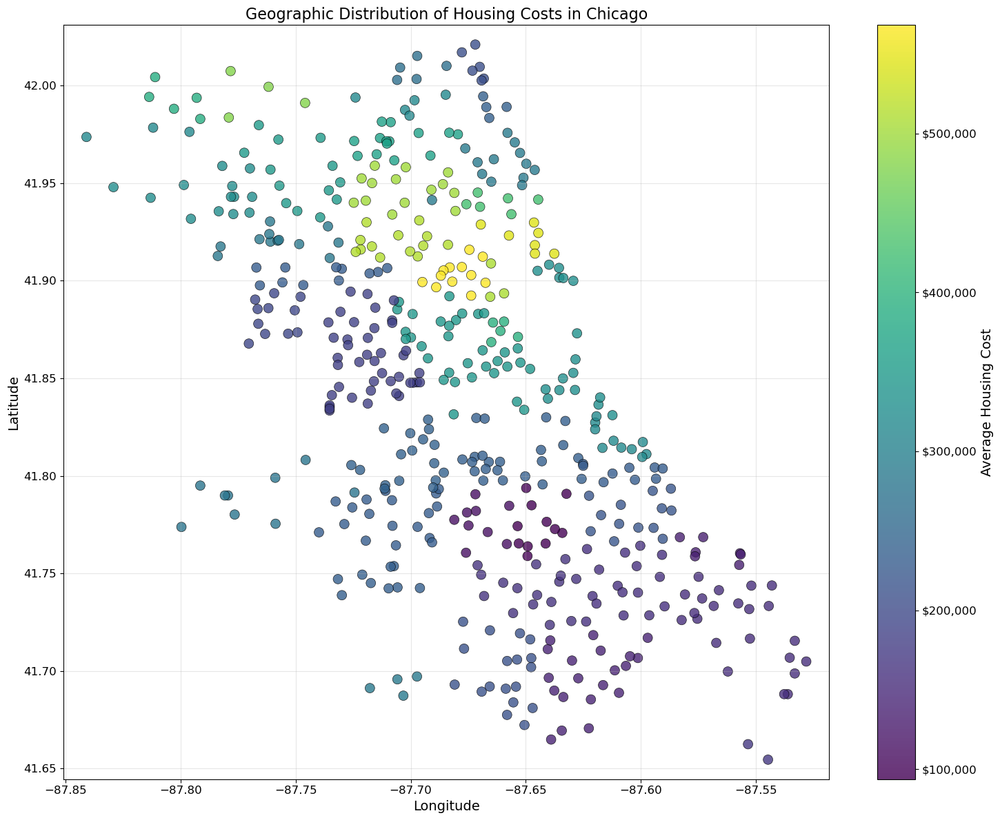

In [19]:
plt.figure(figsize=(15, 12))


scatter = plt.scatter(
    map_df['School_Longitude'], 
    map_df['School_Latitude'],
    c=map_df['average_housing_cost_2023'],
    cmap='viridis',
    alpha=0.8,
    s=100,
    edgecolors='black',
    linewidths=0.5
)


cbar = plt.colorbar(scatter, format=currency_format)
cbar.set_label('Average Housing Cost', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.title('Geographic Distribution of Housing Costs in Chicago', fontsize=16)
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Latitude', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()


x_min, x_max = map_df['School_Longitude'].min(), map_df['School_Longitude'].max()
y_min, y_max = map_df['School_Latitude'].min(), map_df['School_Latitude'].max()

plt.xlim(x_min - 0.01, x_max + 0.01)
plt.ylim(y_min - 0.01, y_max + 0.01)

# plt.savefig('chicago_housing_map.png', dpi=300, bbox_inches='tight')
plt.show()

/var/folders/h6/655zg1890sg4l1s1rk51_cz00000gn/T/ipykernel_45083/20323279.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  rating_cmap = plt.cm.get_cmap('RdYlGn', 3)


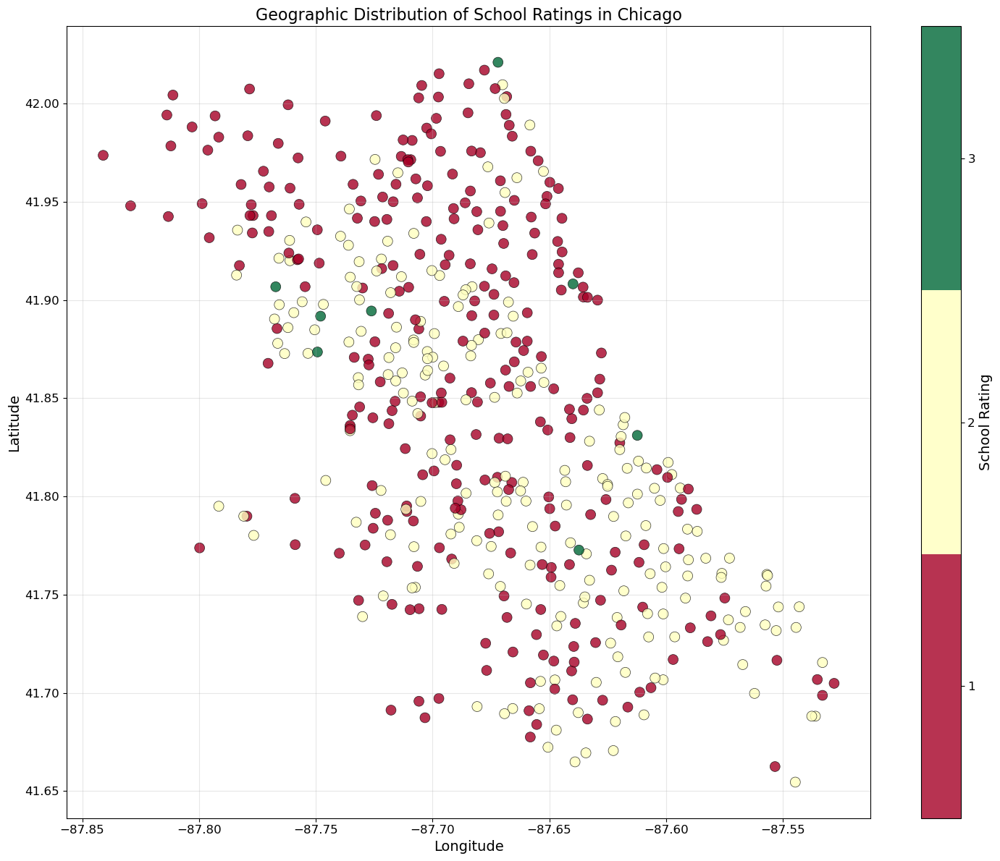

In [20]:
plt.figure(figsize=(15, 12))

rating_cmap = plt.cm.get_cmap('RdYlGn', 3)

scatter = plt.scatter(
    map_df['School_Longitude'], 
    map_df['School_Latitude'],
    c=map_df['Overall_Rating'],
    cmap=rating_cmap,
    alpha=0.8,
    s=100,
    edgecolors='black',
    linewidths=0.5,
    vmin=0.5,
    vmax=3.5
)

cbar = plt.colorbar(scatter, ticks=[1, 2, 3])
cbar.set_label('School Rating', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.title('Geographic Distribution of School Ratings in Chicago', fontsize=16)
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Latitude', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('chicago_school_rating_map.png', dpi=300, bbox_inches='tight')
plt.show()

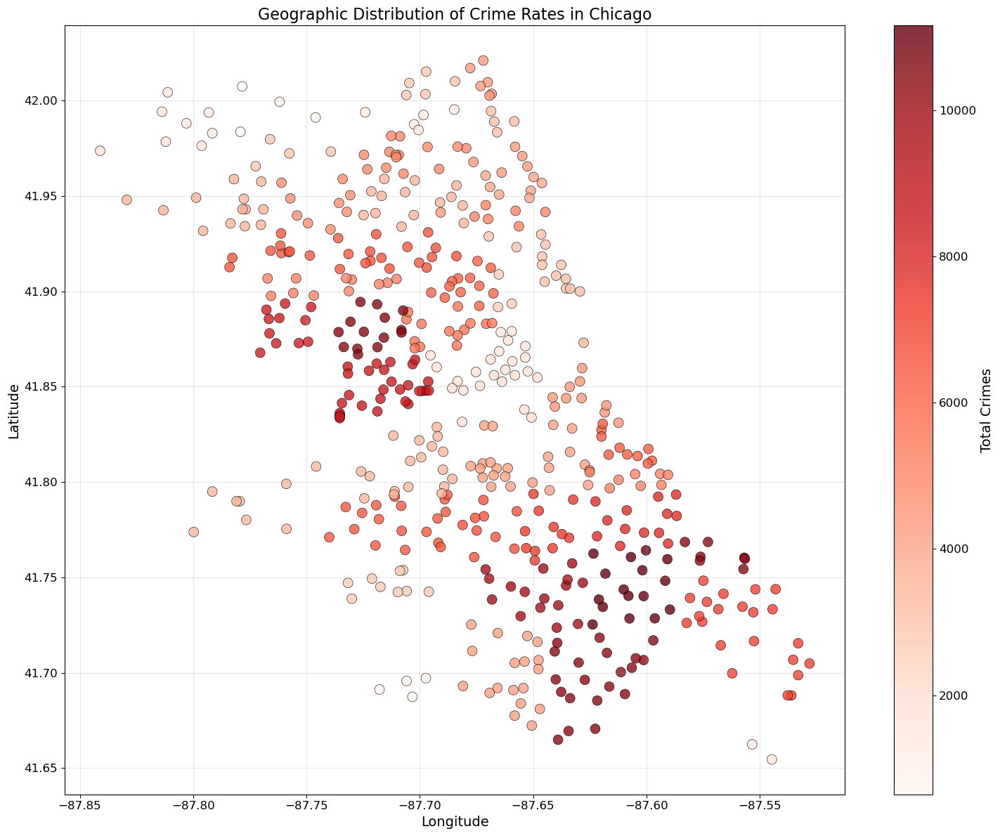

In [21]:
plt.figure(figsize=(15, 12))

scatter = plt.scatter(
    map_df['School_Longitude'], 
    map_df['School_Latitude'],
    c=map_df['Total_Crimes'],
    cmap='Reds',
    alpha=0.8,
    s=100,
    edgecolors='black',
    linewidths=0.5
)

cbar = plt.colorbar(scatter)
cbar.set_label('Total Crimes', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.title('Geographic Distribution of Crime Rates in Chicago', fontsize=16)
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Latitude', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('chicago_crime_map.png', dpi=300, bbox_inches='tight')
plt.show()

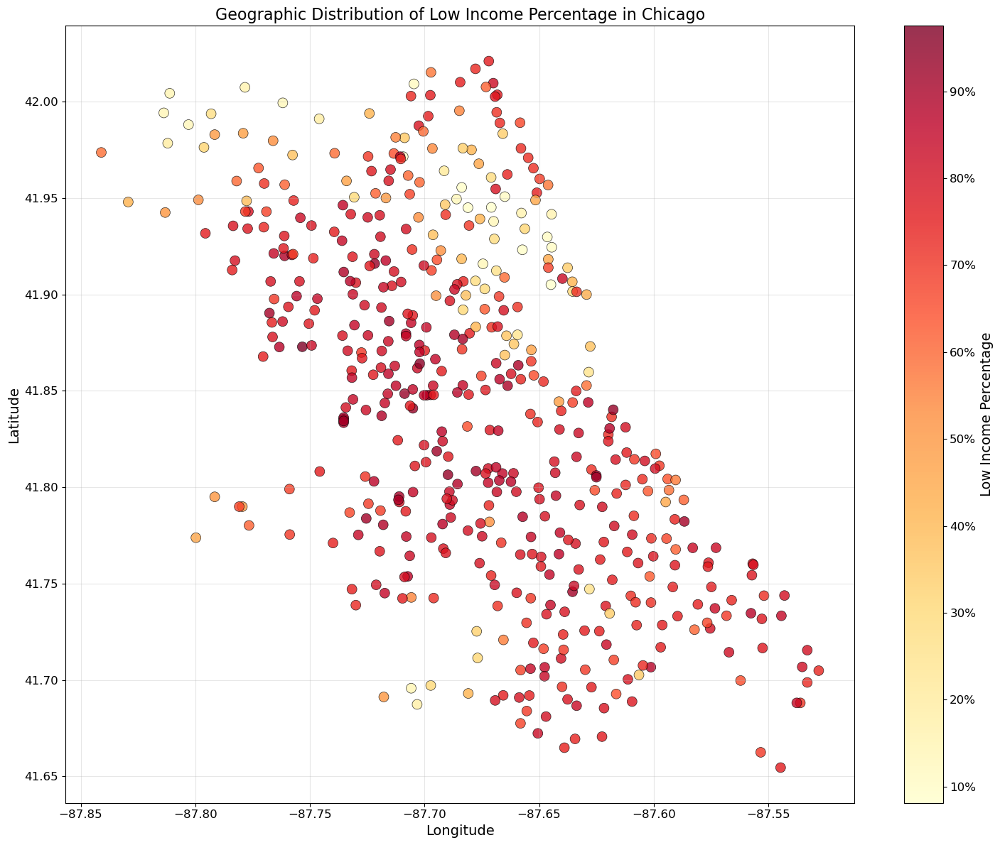

In [22]:
plt.figure(figsize=(15, 12))

scatter = plt.scatter(
    map_df['School_Longitude'], 
    map_df['School_Latitude'],
    c=map_df['Low_Income_Percentage']*100,
    cmap='YlOrRd',
    alpha=0.8,
    s=100,
    edgecolors='black',
    linewidths=0.5
)

cbar = plt.colorbar(scatter, format=pct_format)
cbar.set_label('Low Income Percentage', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.title('Geographic Distribution of Low Income Percentage in Chicago', fontsize=16)
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Latitude', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('chicago_low_income_map.png', dpi=300, bbox_inches='tight')
plt.show()

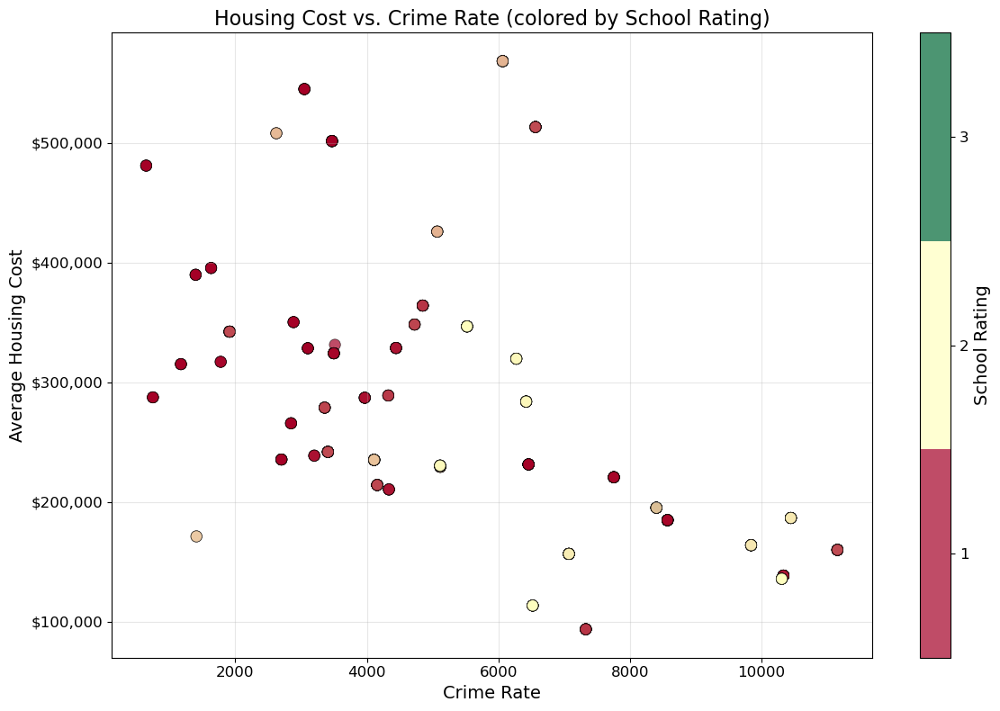

In [23]:
plt.figure(figsize=(12, 8))

scatter = plt.scatter(
    map_df['Total_Crimes'],
    map_df['average_housing_cost_2023'],
    c=map_df['Overall_Rating'],
    cmap=rating_cmap,
    alpha=0.7,
    s=80,
    edgecolors='black',
    linewidths=0.5,
    vmin=0.5,
    vmax=3.5
)

cbar = plt.colorbar(scatter, ticks=[1, 2, 3])
cbar.set_label('School Rating', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.gca().yaxis.set_major_formatter(currency_format)

plt.title('Housing Cost vs. Crime Rate (colored by School Rating)', fontsize=16)
plt.xlabel('Crime Rate', fontsize=14)
plt.ylabel('Average Housing Cost', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('housing_crime_scatter.png', dpi=300, bbox_inches='tight')
plt.show()

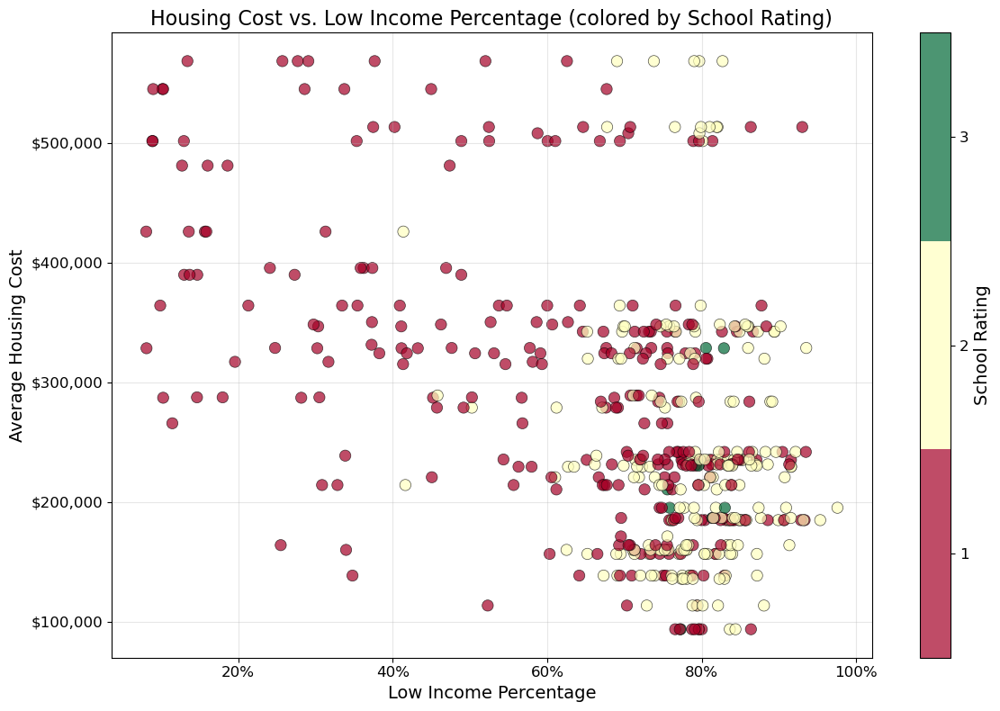

In [24]:
plt.figure(figsize=(12, 8))

scatter = plt.scatter(
    map_df['Low_Income_Percentage'] * 100,
    map_df['average_housing_cost_2023'],
    c=map_df['Overall_Rating'],
    cmap=rating_cmap,
    alpha=0.7,
    s=80,
    edgecolors='black',
    linewidths=0.5,
    vmin=0.5,
    vmax=3.5
)

cbar = plt.colorbar(scatter, ticks=[1, 2, 3])
cbar.set_label('School Rating', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.gca().yaxis.set_major_formatter(currency_format)
plt.gca().xaxis.set_major_formatter(pct_format)

plt.title('Housing Cost vs. Low Income Percentage (colored by School Rating)', fontsize=16)
plt.xlabel('Low Income Percentage', fontsize=14)
plt.ylabel('Average Housing Cost', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('housing_income_scatter.png', dpi=300, bbox_inches='tight')
plt.show()

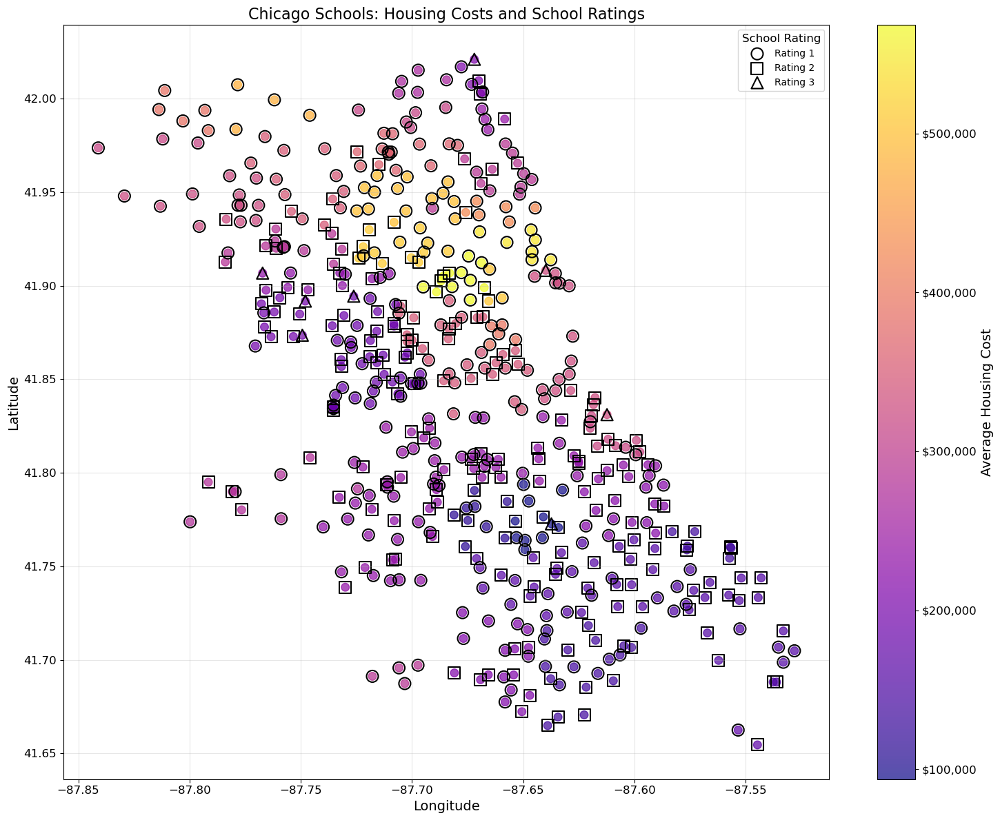

In [25]:
fig, ax = plt.subplots(figsize=(15, 12))

scatter = ax.scatter(
    map_df['School_Longitude'],
    map_df['School_Latitude'],
    c=map_df['average_housing_cost_2023'],
    cmap='plasma',
    alpha=0.7,
    s=70
)

markers = {1: 'o', 2: 's', 3: '^'}
for rating in markers:
    mask = map_df['Overall_Rating'] == rating
    if mask.any():
        ax.scatter(
            map_df.loc[mask, 'School_Longitude'],
            map_df.loc[mask, 'School_Latitude'],
            marker=markers[rating],
            facecolors='none',
            edgecolors='black',
            linewidths=1.5,
            s=150,
            label=f'Rating {rating}'
        )

cbar = plt.colorbar(scatter, format=currency_format)
cbar.set_label('Average Housing Cost', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.title('Chicago Schools: Housing Costs and School Ratings', fontsize=16)
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Latitude', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='School Rating', title_fontsize=12, fontsize=10, loc='best')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('chicago_housing_rating_combined.png', dpi=300, bbox_inches='tight')
plt.show()

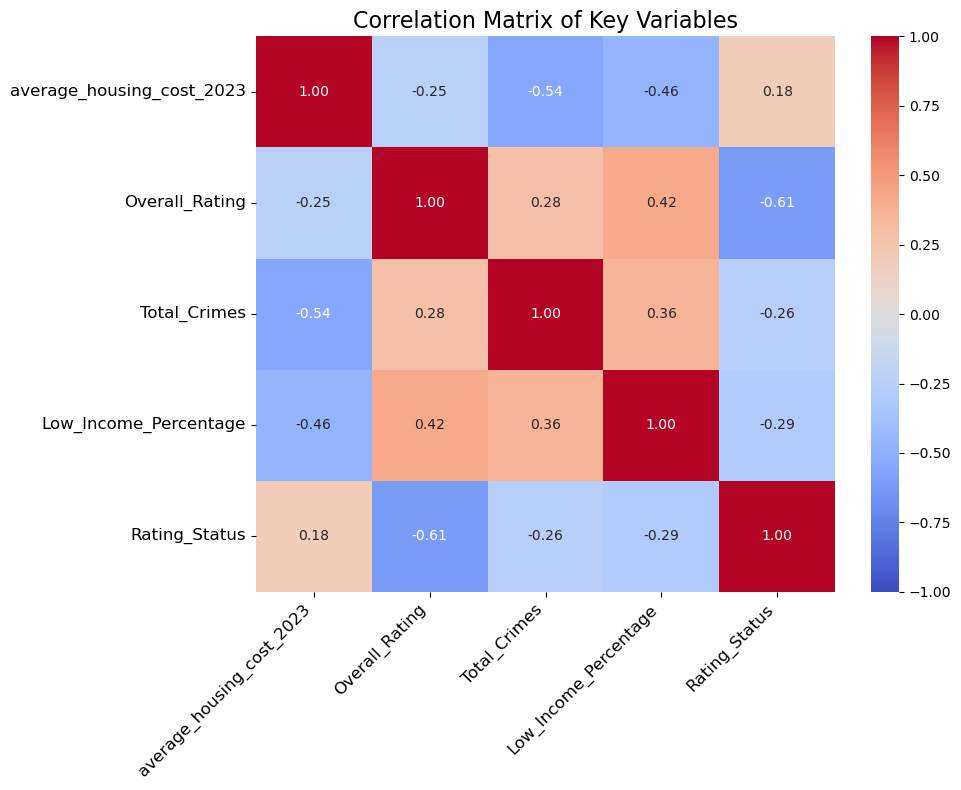

In [26]:

corr_vars = ['average_housing_cost_2023', 'Overall_Rating', 
             'Total_Crimes', 'Low_Income_Percentage',
             'Rating_Status']
corr_matrix = map_df[corr_vars].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f')
plt.title('Correlation Matrix of Key Variables', fontsize=16)
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig('correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

Dataset shape: (503, 9)

Class mapping:
Original rating 1.0 → Encoded as 0
Original rating 2.0 → Encoded as 1
Original rating 3.0 → Encoded as 2

Model Accuracy: 0.7426

Classification Report:
              precision    recall  f1-score   support

         1.0       0.73      0.84      0.78        56
         2.0       0.76      0.65      0.70        43
         3.0       0.00      0.00      0.00         2

    accuracy                           0.74       101
   macro avg       0.50      0.50      0.49       101
weighted avg       0.73      0.74      0.73       101



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


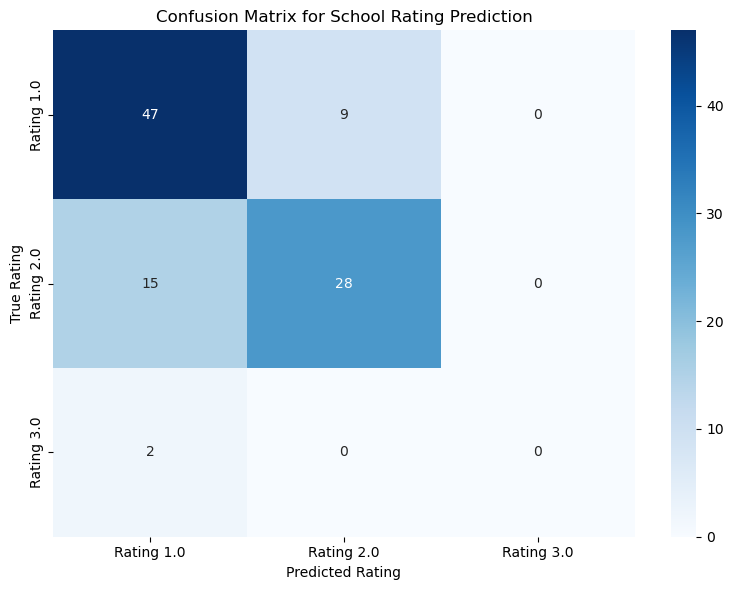

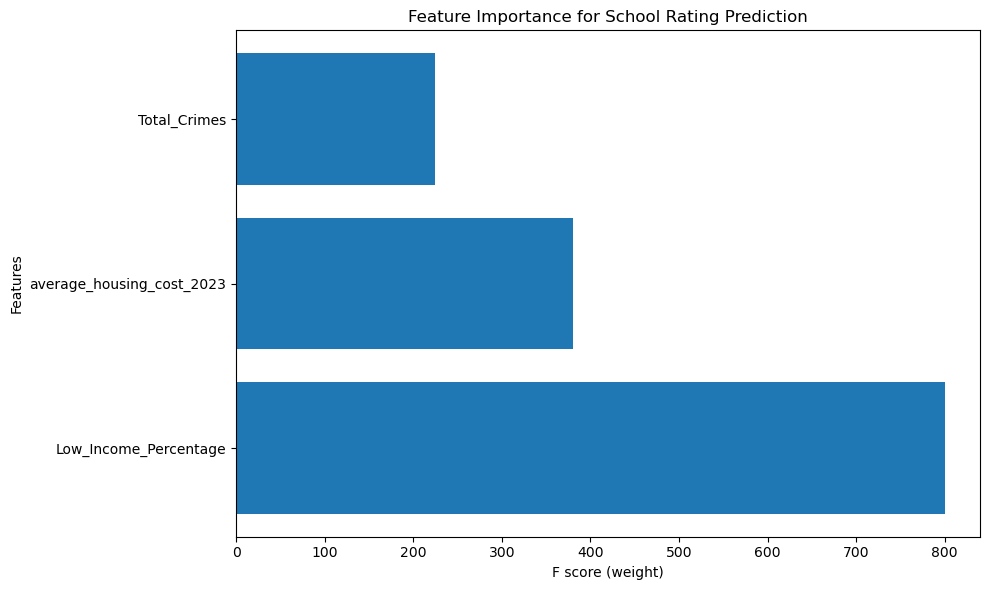

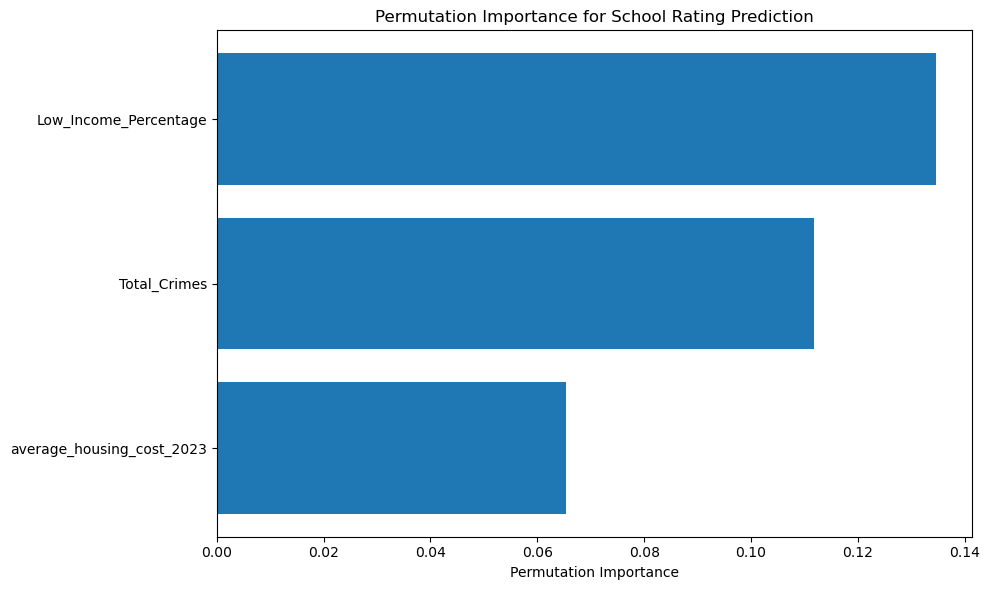

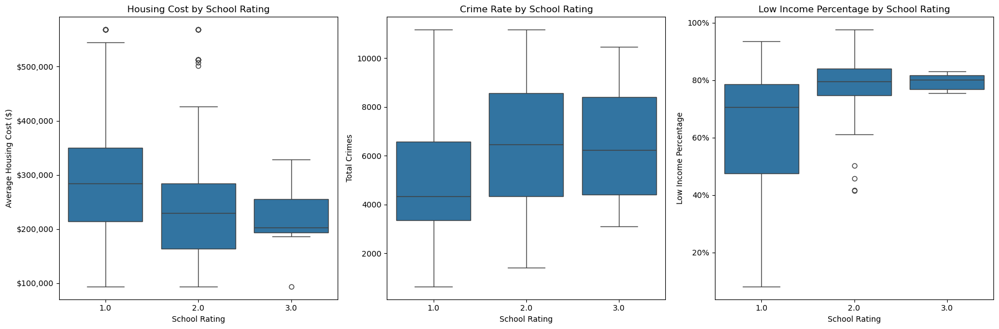

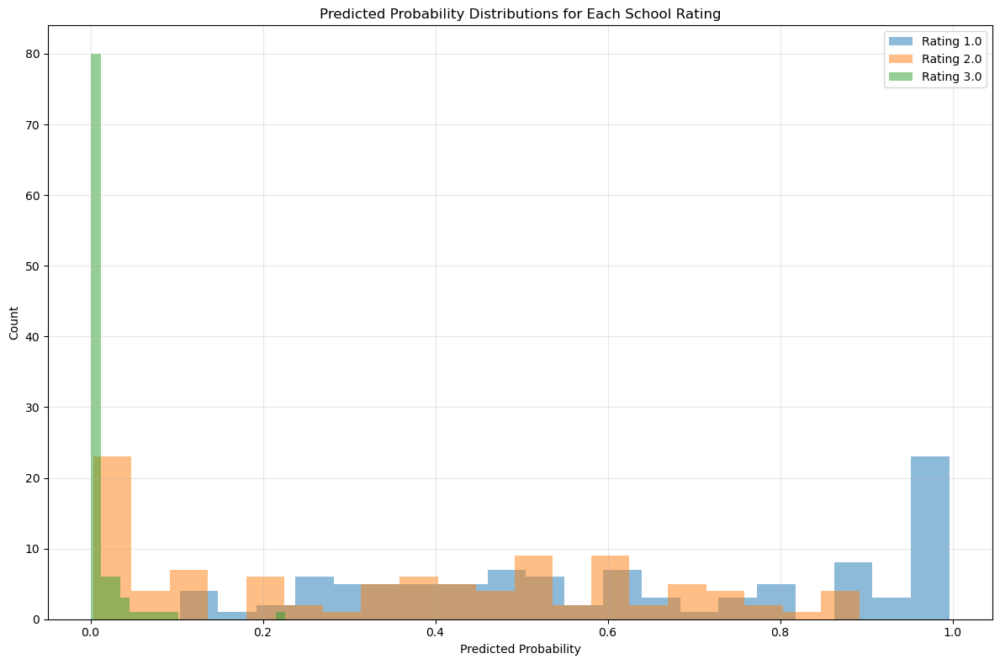

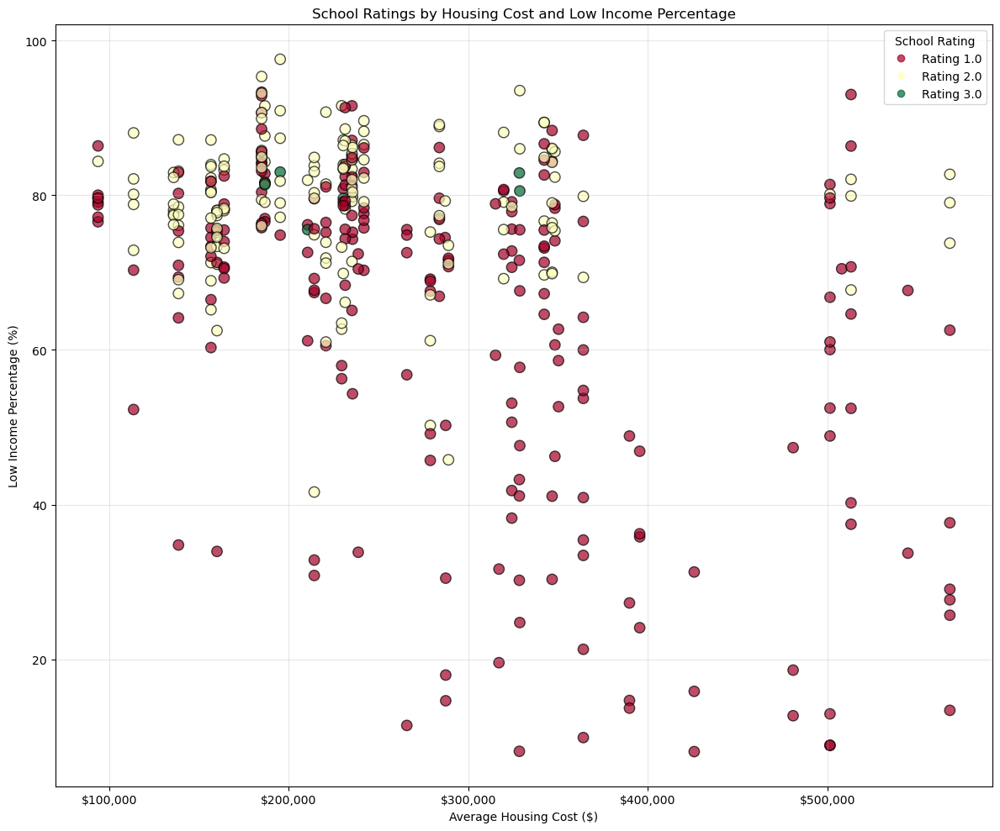

-------------------------------------------------------------
Model Accuracy: 0.7426
Feature Importance Ranking:
  - Low_Income_Percentage: 0.4578
  - Total_Crimes: 0.3018
  - average_housing_cost_2023: 0.2404


In [27]:
print("Dataset shape:", map_df.shape)

X = map_df[['average_housing_cost_2023', 'Total_Crimes', 'Low_Income_Percentage']]
y = map_df['Overall_Rating']

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

print("\nClass mapping:")
for i, original in enumerate(label_encoder.classes_):
    print(f"Original rating {original} → Encoded as {i}")

X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=len(label_encoder.classes_),
    learning_rate=0.1,
    max_depth=3,
    n_estimators=100,
    random_state=42
)

model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
print(f"\nModel Accuracy: {accuracy:.4f}")

y_test_original = label_encoder.inverse_transform(y_test)
y_pred_original = label_encoder.inverse_transform(y_pred)


print("\nClassification Report:")
print(classification_report(y_test_original, y_pred_original))

plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test_original, y_pred_original)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=[f'Rating {r}' for r in label_encoder.classes_],
            yticklabels=[f'Rating {r}' for r in label_encoder.classes_])
plt.title('Confusion Matrix for School Rating Prediction')
plt.xlabel('Predicted Rating')
plt.ylabel('True Rating')
plt.tight_layout()
plt.savefig('school_rating_confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(10, 6))
feature_importance = model.get_booster().get_score(importance_type='weight')
importance_df = pd.DataFrame({
    'feature': list(feature_importance.keys()),
    'importance': list(feature_importance.values())
}).sort_values('importance', ascending=False)

feature_names = X.columns
importance_df['feature_name'] = importance_df['feature'].map(lambda x: feature_names[int(x.replace('f', ''))])

plt.barh(importance_df['feature_name'], importance_df['importance'])
plt.title('Feature Importance for School Rating Prediction')
plt.xlabel('F score (weight)')
plt.ylabel('Features')
plt.tight_layout()
plt.savefig('school_rating_feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

perm_importance = permutation_importance(model, X_test_scaled, y_test, n_repeats=10, random_state=42)
sorted_idx = perm_importance.importances_mean.argsort()

plt.figure(figsize=(10, 6))
plt.barh(range(X.shape[1]), perm_importance.importances_mean[sorted_idx])
plt.yticks(range(X.shape[1]), [X.columns[i] for i in sorted_idx])
plt.title('Permutation Importance for School Rating Prediction')
plt.xlabel('Permutation Importance')
plt.tight_layout()
plt.savefig('school_rating_permutation_importance.png', dpi=300, bbox_inches='tight')
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.boxplot(x='Overall_Rating', y='average_housing_cost_2023', data=map_df, ax=axes[0])
axes[0].set_title('Housing Cost by School Rating')
axes[0].set_xlabel('School Rating')
axes[0].set_ylabel('Average Housing Cost ($)')
axes[0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

sns.boxplot(x='Overall_Rating', y='Total_Crimes', data=map_df, ax=axes[1])
axes[1].set_title('Crime Rate by School Rating')
axes[1].set_xlabel('School Rating')
axes[1].set_ylabel('Total Crimes')

sns.boxplot(x='Overall_Rating', y='Low_Income_Percentage', data=map_df, ax=axes[2])
axes[2].set_title('Low Income Percentage by School Rating')
axes[2].set_xlabel('School Rating')
axes[2].set_ylabel('Low Income Percentage')
axes[2].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.0%}'))

plt.tight_layout()
plt.savefig('school_rating_feature_relationships.png', dpi=300, bbox_inches='tight')
plt.show()

y_prob = model.predict_proba(X_test_scaled)

plt.figure(figsize=(12, 8))
for i in range(len(label_encoder.classes_)):
    plt.hist(y_prob[:, i], bins=20, alpha=0.5, label=f'Rating {label_encoder.classes_[i]}')
    
plt.title('Predicted Probability Distributions for Each School Rating')
plt.xlabel('Predicted Probability')
plt.ylabel('Count')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('school_rating_probability_distributions.png', dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(12, 10))

scatter = plt.scatter(
    X_train['average_housing_cost_2023'], 
    X_train['Low_Income_Percentage']*100,
    c=y_train,
    cmap='RdYlGn',
    alpha=0.7,
    s=80,
    edgecolors='k'
)

plt.title('School Ratings by Housing Cost and Low Income Percentage')
plt.xlabel('Average Housing Cost ($)')
plt.ylabel('Low Income Percentage (%)')

plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

rating_labels = [f'Rating {r}' for r in label_encoder.classes_]
legend = plt.legend(handles=scatter.legend_elements()[0], labels=rating_labels, 
                   title="School Rating", loc="upper right")

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('school_rating_scatter.png', dpi=300, bbox_inches='tight')
plt.show()

print("-------------------------------------------------------------")
print(f"Model Accuracy: {accuracy:.4f}")
feature_imp = dict(zip(X.columns, model.feature_importances_))
sorted_imp = sorted(feature_imp.items(), key=lambda x: x[1], reverse=True)
print("Feature Importance Ranking:")
for feature, importance in sorted_imp:
    print(f"  - {feature}: {importance:.4f}")

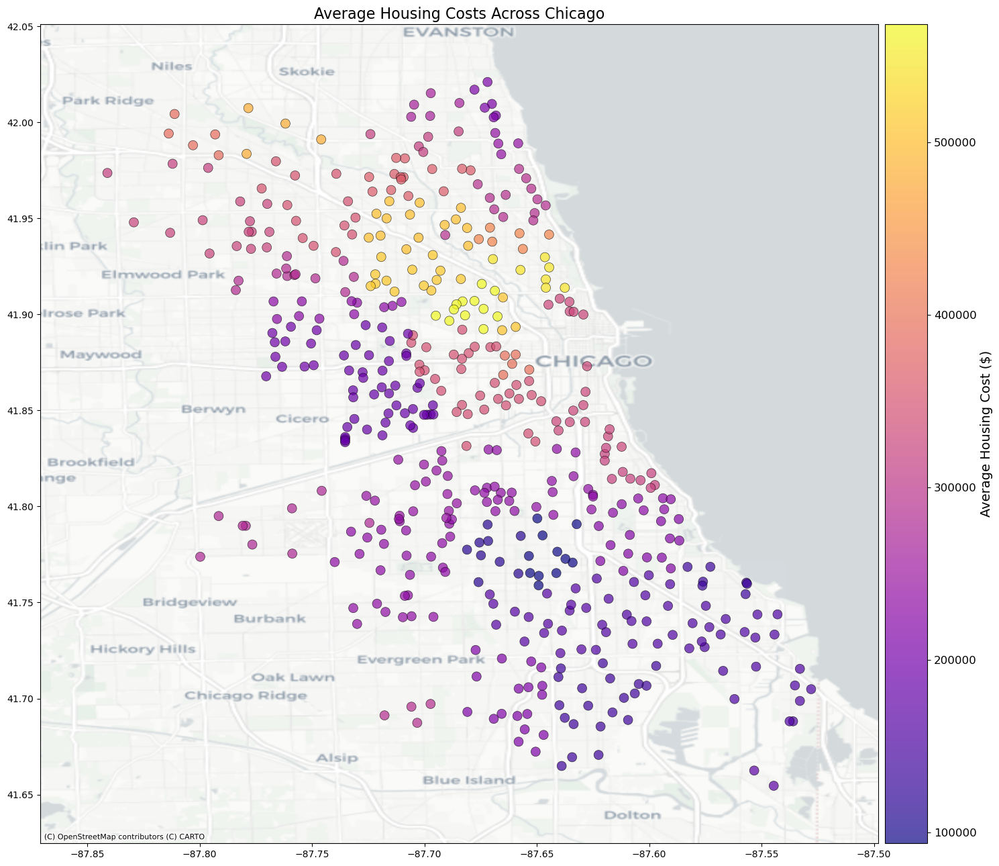

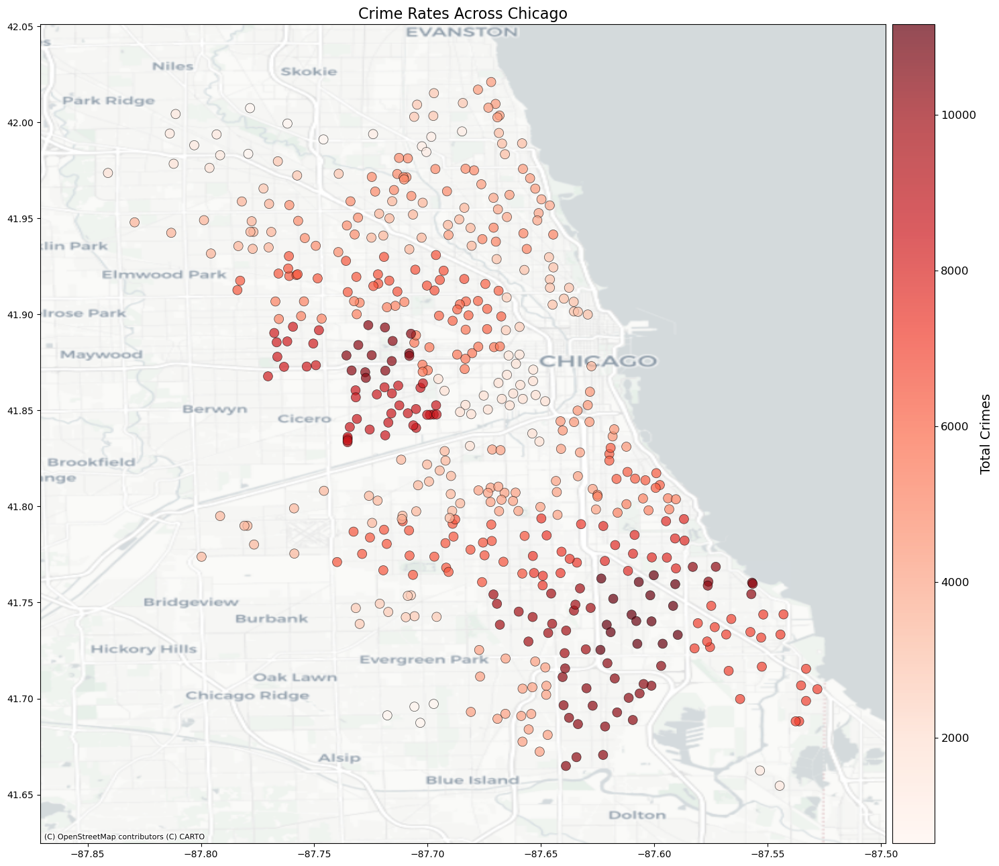

In [28]:
plt.figure(figsize=(15, 13))

ax = plt.subplot()
ax.set_title('Average Housing Costs Across Chicago', fontsize=16)

scatter = ax.scatter(
    map_df['School_Longitude'],
    map_df['School_Latitude'],
    c=map_df['average_housing_cost_2023'],
    cmap='plasma',
    alpha=0.7,
    s=100,
    edgecolors='black',
    linewidths=0.5
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
cbar = plt.colorbar(scatter, cax=cax)
cbar.set_label('Average Housing Cost ($)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

ax.set_xlim(map_df['School_Longitude'].min() - 0.03, map_df['School_Longitude'].max() + 0.03)
ax.set_ylim(map_df['School_Latitude'].min() - 0.03, map_df['School_Latitude'].max() + 0.03)
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron)

ax.set_xlabel('')
ax.set_ylabel('')

plt.tight_layout()
plt.savefig('chicago_housing_costs_map.png', dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(15, 13))

ax = plt.subplot()
ax.set_title('Crime Rates Across Chicago', fontsize=16)

scatter = ax.scatter(
    map_df['School_Longitude'],
    map_df['School_Latitude'],
    c=map_df['Total_Crimes'],
    cmap='Reds',
    alpha=0.7,
    s=100,
    edgecolors='black',
    linewidths=0.5
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
cbar = plt.colorbar(scatter, cax=cax)
cbar.set_label('Total Crimes', fontsize=14)
cbar.ax.tick_params(labelsize=12)

ax.set_xlim(map_df['School_Longitude'].min() - 0.03, map_df['School_Longitude'].max() + 0.03)
ax.set_ylim(map_df['School_Latitude'].min() - 0.03, map_df['School_Latitude'].max() + 0.03)
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron)

ax.set_xlabel('')
ax.set_ylabel('')

plt.tight_layout()
plt.savefig('chicago_crime_rates_map.png', dpi=300, bbox_inches='tight')
plt.show()

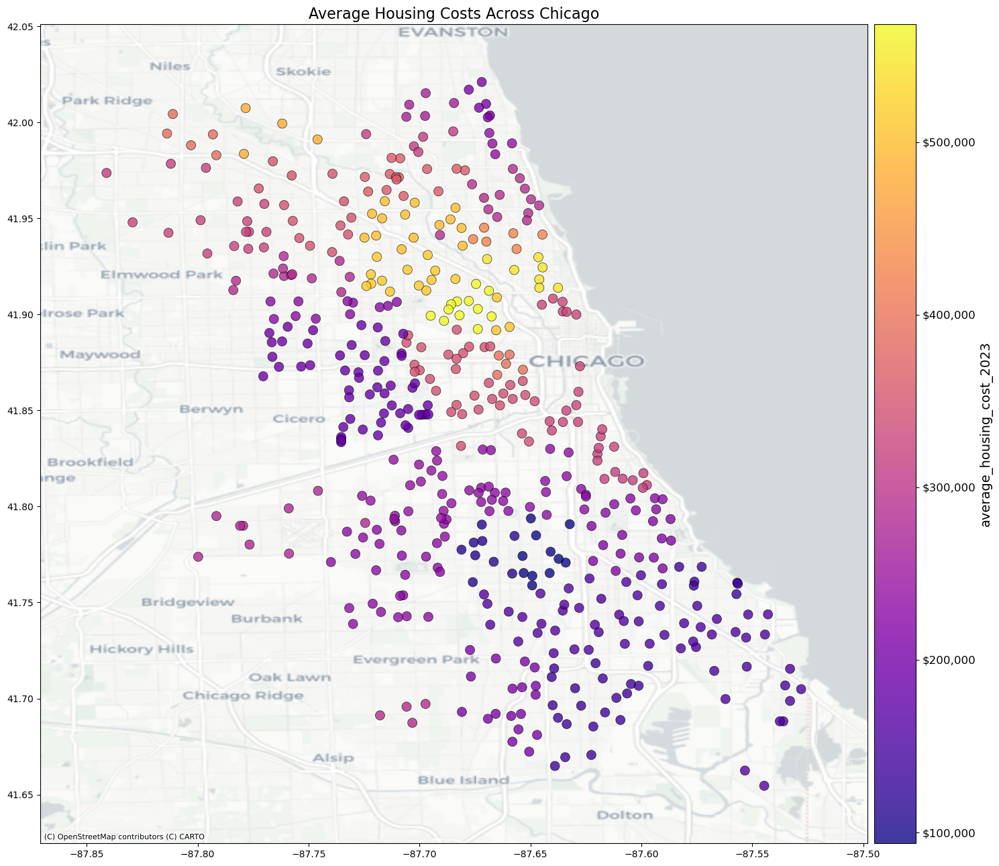

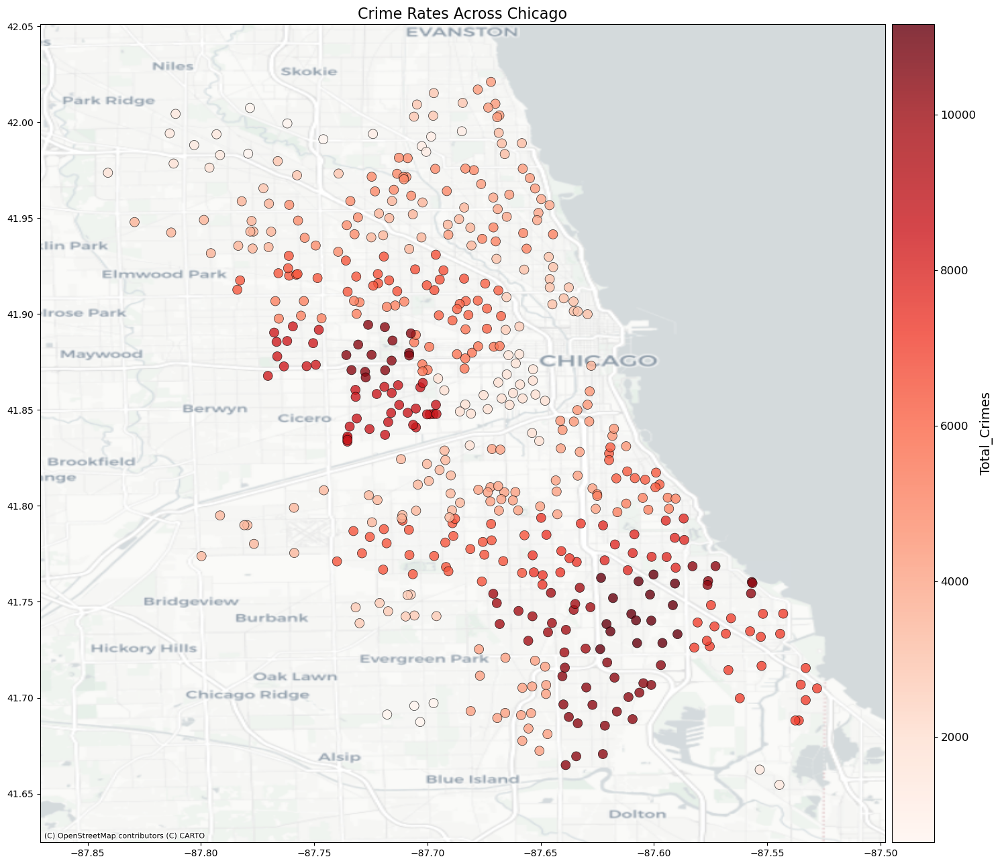

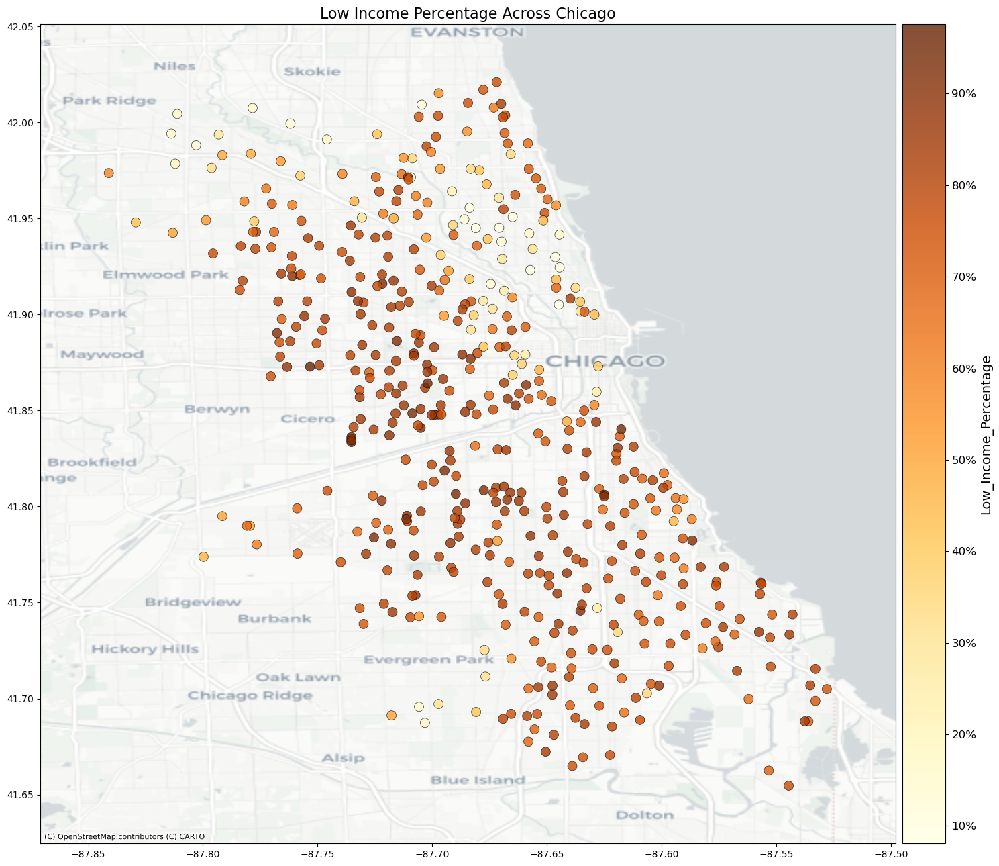

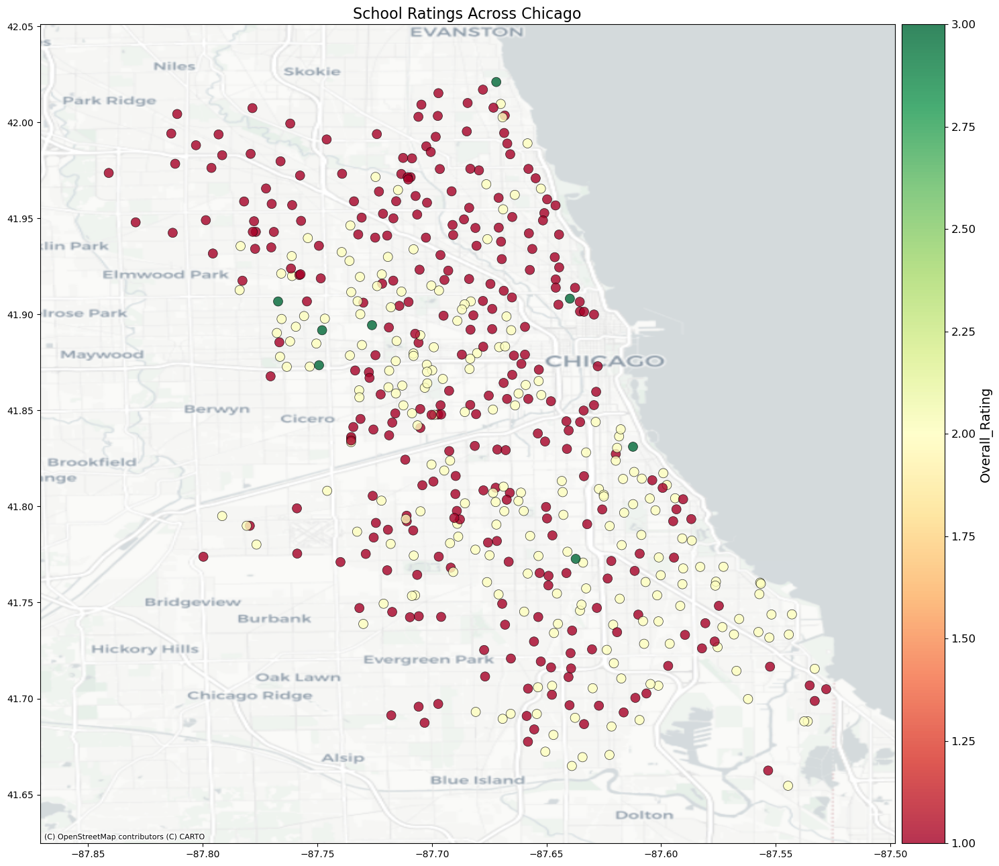

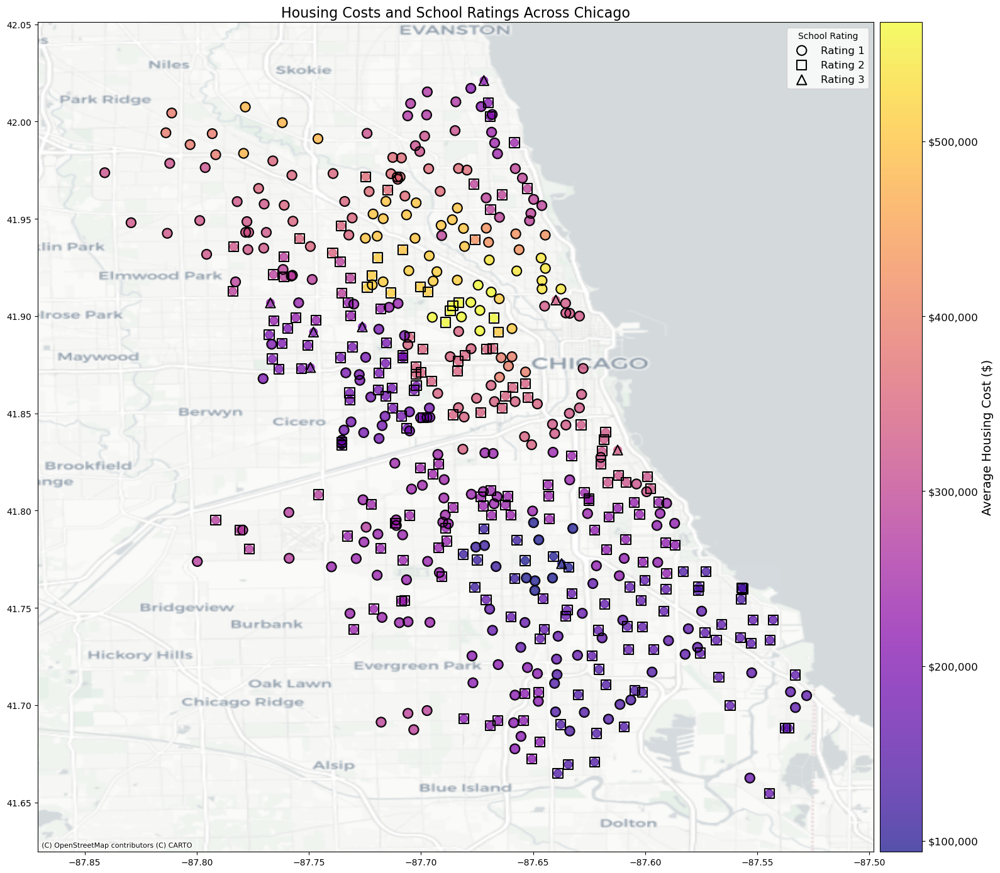

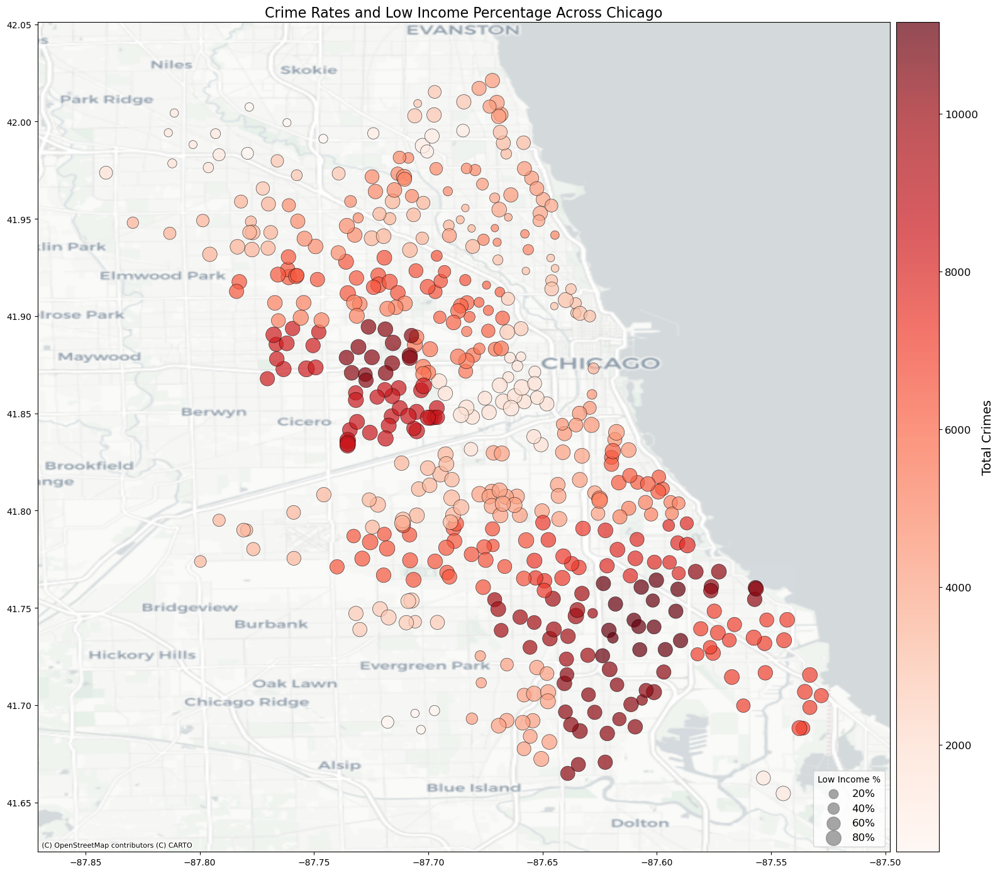

In [29]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import contextily as ctx
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mticker

def create_chicago_map(data, feature, title, cmap, filename, format_func=None):
    plt.figure(figsize=(15, 13))
    
    ax = plt.subplot()
    ax.set_title(title, fontsize=16)
    
    scatter = ax.scatter(
        data['School_Longitude'],
        data['School_Latitude'],
        c=data[feature],
        cmap=cmap,
        alpha=0.8,
        s=100,
        edgecolors='black',
        linewidths=0.5
    )
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    
    if format_func:
        cbar = plt.colorbar(scatter, cax=cax, format=format_func)
    else:
        cbar = plt.colorbar(scatter, cax=cax)
        
    cbar.set_label(feature, fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    ax.set_xlim(data['School_Longitude'].min() - 0.03, data['School_Longitude'].max() + 0.03)
    ax.set_ylim(data['School_Latitude'].min() - 0.03, data['School_Latitude'].max() + 0.03)
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron)
    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    plt.tight_layout()
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

def currency_formatter(x, pos):
    return f"${x:,.0f}"
currency_format = mticker.FuncFormatter(currency_formatter)

def percentage_formatter(x, pos):
    return f"{x:.0%}"
pct_format = mticker.FuncFormatter(percentage_formatter)

try:
    import contextily as ctx
except ImportError:
    print("Installing contextily...")
    !pip install contextily
    import contextily as ctx

create_chicago_map(
    map_df, 
    'average_housing_cost_2023', 
    'Average Housing Costs Across Chicago', 
    'plasma', 
    'chicago_housing_costs_map_basemap.png', 
    currency_format
)

create_chicago_map(
    map_df, 
    'Total_Crimes', 
    'Crime Rates Across Chicago', 
    'Reds', 
    'chicago_crime_rates_map_basemap.png'
)

create_chicago_map(
    map_df, 
    'Low_Income_Percentage', 
    'Low Income Percentage Across Chicago', 
    'YlOrBr', 
    'chicago_low_income_map_basemap.png', 
    percentage_formatter
)

create_chicago_map(
    map_df, 
    'Overall_Rating', 
    'School Ratings Across Chicago', 
    'RdYlGn', 
    'chicago_school_ratings_map_basemap.png'
)

plt.figure(figsize=(16, 14))
ax = plt.subplot()
ax.set_title('Housing Costs and School Ratings Across Chicago', fontsize=16)

scatter = ax.scatter(
    map_df['School_Longitude'],
    map_df['School_Latitude'],
    c=map_df['average_housing_cost_2023'],
    cmap='plasma',
    alpha=0.7,
    s=80
)

markers = {1: 'o', 2: 's', 3: '^'}
for rating in markers:
    mask = map_df['Overall_Rating'] == rating
    if mask.any():
        ax.scatter(
            map_df.loc[mask, 'School_Longitude'],
            map_df.loc[mask, 'School_Latitude'],
            marker=markers[rating],
            facecolors='none',
            edgecolors='black',
            linewidths=1.5,
            s=120,
            label=f'Rating {rating}'
        )

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
cbar = plt.colorbar(scatter, cax=cax, format=currency_format)
cbar.set_label('Average Housing Cost ($)', fontsize=14)
cbar.ax.tick_params(labelsize=12)

ax.legend(title='School Rating', fontsize=12)

ax.set_xlim(map_df['School_Longitude'].min() - 0.03, map_df['School_Longitude'].max() + 0.03)
ax.set_ylim(map_df['School_Latitude'].min() - 0.03, map_df['School_Latitude'].max() + 0.03)
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron)

ax.set_xlabel('')
ax.set_ylabel('')

plt.tight_layout()
plt.savefig('chicago_housing_schools_combined_basemap.png', dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(16, 14))
ax = plt.subplot()
ax.set_title('Crime Rates and Low Income Percentage Across Chicago', fontsize=16)

scatter = ax.scatter(
    map_df['School_Longitude'],
    map_df['School_Latitude'],
    c=map_df['Total_Crimes'],
    s=map_df['Low_Income_Percentage']*300 + 50,
    cmap='Reds',
    alpha=0.7,
    edgecolors='black',
    linewidths=0.5
)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
cbar = plt.colorbar(scatter, cax=cax)
cbar.set_label('Total Crimes', fontsize=14)
cbar.ax.tick_params(labelsize=12)

low_income_handles = [
    plt.scatter([], [], s=0.2*300+50, color='gray', alpha=0.7),
    plt.scatter([], [], s=0.4*300+50, color='gray', alpha=0.7),
    plt.scatter([], [], s=0.6*300+50, color='gray', alpha=0.7),
    plt.scatter([], [], s=0.8*300+50, color='gray', alpha=0.7)
]
ax.legend(low_income_handles, ['20%', '40%', '60%', '80%'], 
        title='Low Income %', fontsize=12, loc='lower right')

ax.set_xlim(map_df['School_Longitude'].min() - 0.03, map_df['School_Longitude'].max() + 0.03)
ax.set_ylim(map_df['School_Latitude'].min() - 0.03, map_df['School_Latitude'].max() + 0.03)
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron)

ax.set_xlabel('')
ax.set_ylabel('')

plt.tight_layout()
plt.savefig('chicago_crime_income_basemap.png', dpi=300, bbox_inches='tight')
plt.show()

In [30]:
import os
import glob

png_dir = 'png_files'
if not os.path.exists(png_dir):
    os.makedirs(png_dir)
    print(f"Created directory: {png_dir}")

png_files = glob.glob('*.png')
print(f"Found {len(png_files)} PNG files")

for file in png_files:
    destination = os.path.join(png_dir, file)
    os.rename(file, destination)
    print(f"Moved: {file} -> {destination}")

print(f"Successfully organized {len(png_files)} PNG files into '{png_dir}' folder")

Found 23 PNG files
Moved: housing_crime_scatter.png -> png_files/housing_crime_scatter.png
Moved: school_rating_feature_relationships.png -> png_files/school_rating_feature_relationships.png
Moved: school_rating_confusion_matrix.png -> png_files/school_rating_confusion_matrix.png
Moved: chicago_housing_costs_map.png -> png_files/chicago_housing_costs_map.png
Moved: correlation_matrix.png -> png_files/correlation_matrix.png
Moved: chicago_school_ratings_map_basemap.png -> png_files/chicago_school_ratings_map_basemap.png
Moved: school_rating_probability_distributions.png -> png_files/school_rating_probability_distributions.png
Moved: chicago_crime_rates_map_basemap.png -> png_files/chicago_crime_rates_map_basemap.png
Moved: chicago_crime_rates_map.png -> png_files/chicago_crime_rates_map.png
Moved: chicago_housing_rating_combined.png -> png_files/chicago_housing_rating_combined.png
Moved: chicago_housing_map.png -> png_files/chicago_housing_map.png
Moved: school_rating_feature_importance